In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import os

In [69]:
adata = sc.read_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet.h5ad")

In [3]:
print(adata.obs['all_celltype'].unique().tolist())

['Unannotated', 'Tm5a', 'R1-6', 'R7', 'Lai', 'TmY3', 'CONE-1', 'EPI', 'FAT-1', 'T4T5', 'OCHG', 'TmY4', 'LC12', 'JON', 'T1', 'AL-PN', 'L3', 'T4T5ab', 'LC17', 'LPLC2', 'Tm9', 'LC4', 'ALG', 'TmY14', 'CONE-2', 'PGM', 'LC10a', 'Tm1', 'L2', 'CG', 'EB-RN', 'Mi1', 'KCab', 'KCapbp', 'Mi15', 'HE', 'Mi4', 'MUS', 'Mi9', 'T2', 'FAT-2', 'T2a', 'SPG', 'Tm2', 'DRA', 'T4T5cd', 'CLKN', 'R8', 'Dm9', 'Dm10', 'DAN', 'KCy', 'LAWF1', 'L5', 'T3', 'PAM-DAN', 'PNG', 'LC10b', 'L1', 'L4', 'EG', 'ORN', 'PB', 'Dm3', 'LLPC1', 'Dm8', 'LPC1', 'CHG', 'LC14', 'TmY8', 'Tm4', 'LAWF2', 'dFB', 'Dm2', 'C3', 'LC16', 'LPLC1', 'C2', 'LEMG', 'LC21', 'Dm12', 'TmY5a', 'OCR', 'Pm4', 'Tm20', 'AudSN', 'LC22-LPLC4', 'LC11', 'SERN', 'LC10d', 'Pm3', 'Dm4', 'LC18', 'Dm11', 'LC6', 'Dm1', 'LC20', 'OAN', 'Pm2', 'Pm1', 'TYRN', 'Tm5c', 'LC13', 'DCN', 'Tm29']


In [70]:
adata = adata[adata.obs['batch'] != '20230925'].copy()

In [30]:
#adata = adata[adata.obs['all_celltype'] != 'Unannotated'].copy()

In [101]:
bdata

AnnData object with n_obs × n_vars = 489543 × 17136
    obs: 'sample', 'Unmatched_rate', 'UMI_count', 'Gene_count', 'PCR_batch', 'Ligation_barcodes', 'ShortdT_UMI_count', 'RandomN_UMI_count', 'RT_barcodes_shortdT', 'Plate_ID', 'order_bc', 'row', 'col', 'barcode', 'Conditions', 'priming', 'sample.1', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'RT_barcode', 'doublet_scores', 'doublet', 'unsup_celltype', 'sex', 'genotype', 'light_condition', 'batch', 'replicate', 'new_Conditions', 'timepoint', 'new_timepoint', 'final_Conditions', 'main_celltype', 'celltype_without_neurons', 'neuron_celltype', 'UMAP_1_neuron', 'UMAP_2_neuron', 'leiden_res_0.20_neuron', 'leiden_res_0.40_neuron', 'leiden_res_0.60_neuron', 'leiden_res_0.80_neuron', 'leiden_res_1.00_neuron', 'leiden_res_1.20_neuron', 'leiden_res_1.40_neuron', 'leiden_res_1.60_neur

In [100]:
adata

AnnData object with n_obs × n_vars = 726985 × 17198
    obs: 'sample', 'Unmatched_rate', 'UMI_count', 'Gene_count', 'PCR_batch', 'Ligation_barcodes', 'ShortdT_UMI_count', 'RandomN_UMI_count', 'RT_barcodes_shortdT', 'Plate_ID', 'order_bc', 'row', 'col', 'barcode', 'Conditions', 'priming', 'sample.1', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'RT_barcode', 'doublet_scores', 'doublet', 'unsup_celltype', 'sex', 'genotype', 'light_condition', 'batch', 'replicate', 'new_Conditions', 'timepoint', 'new_timepoint', 'final_Conditions', 'main_celltype', 'celltype_without_neurons', 'leiden_res_4.00_main', 'leiden_res_0.60_main', 'leiden_res_0.10_main', 'leiden_res_0.03_main', 'leiden_res_8.00_main', 'UMAP_1', 'UMAP_2', 'leiden_res_2.00_main', 'all_celltype', 'neuron_celltype', 'UMAP_1_neuron', 'UMAP_2_neuron', 'leiden_res_4.00_neuron

In [49]:
import numpy as np

In [58]:
df.loc[df['cell_type'] == "Unannotated", 'global_resid_score'] = np.nan
df.loc[df['cell_type'] == "Unannotated", 'global_sqrt_score'] = np.nan


In [6]:
sc.set_figure_params(dpi = 300)

In [ ]:
import matplotlib.pyplot as plt
import scanpy as sc

# Make sure your UMAP coords are in adata.obsm['X_umap']

# Define the four conditions (in whatever order you like)
conds = ['WT_LD','WT_DD','MT_LD','MT_DD']

# —— 1) Residual score with shared vmin/vmax —— #

# compute the global min/max over all cells
vmin_resid = adata.obs['global_resid_score'].min()
vmax_resid = adata.obs['global_resid_score'].max()

fig, axes = plt.subplots(2, 2, figsize=(10,10))
axes = axes.flatten()
for ax, cond in zip(axes, conds):
    sub = adata[adata.obs['condition'] == cond]
    sc.pl.umap(
        sub,
        color='global_resid_score',
        ax=ax,
        show=False,
        title=f"{cond} (resid)",
        legend_loc='right margin',
        vmin=vmin_resid,
        vmax=vmax_resid,
    )
plt.tight_layout()
plt.show()

# —— 2) √‐normalized score with shared vmin/vmax —— #

vmin_sqrt = adata.obs['global_sqrt_score'].min()
vmax_sqrt = adata.obs['global_sqrt_score'].max()

fig, axes = plt.subplots(2, 2, figsize=(10,10))
axes = axes.flatten()
for ax, cond in zip(axes, conds):
    sub = adata[adata.obs['condition'] == cond]
    sc.pl.umap(
        sub,
        color='global_sqrt_score',
        ax=ax,
        show=False,
        title=f"{cond} (sqrt)",
        legend_loc='right margin',
        vmin=vmin_sqrt,
        vmax=vmax_sqrt,
    )
plt.tight_layout()
plt.show()


In [5]:
df = pd.read_csv("combined_cluster_rhythmicity_with_resid.csv")
print(df)

                   resolution  cluster  n_cells  n_rhythmic condition  \
0        leiden_res_0.03_main        0    10047           0      MTDD   
1        leiden_res_0.03_main        1     2155           0      MTDD   
2        leiden_res_0.03_main        2       56           0      MTDD   
3        leiden_res_0.03_main        3       42           0      MTDD   
4        leiden_res_0.03_main        4        2           0      MTDD   
...                       ...      ...      ...         ...       ...   
30868  leiden_res_8.00_neuron       95      831           1      WTLD   
30869  leiden_res_8.00_neuron       96       46           2      WTLD   
30870  leiden_res_8.00_neuron       97        7           0      WTLD   
30871  leiden_res_8.00_neuron       98      964           3      WTLD   
30872  leiden_res_8.00_neuron       99      684           1      WTLD   

        leiden_res  log_n_cells  log_n_rhythmic  rhythmicity_resid  \
0        0_03_main     4.002036        0.000000      

In [6]:
df = pd.read_csv("corrected_rhythmicity_scores.csv")
print(df)

    condition cell_type  global_resid_score  global_sqrt_score
0       MT_DD     AL-PN            1.578681           0.671996
1       MT_DD       ALG           -0.195958           0.530530
2       MT_DD        C2           -0.819088           0.452611
3       MT_DD        C3           -0.021833           0.570543
4       MT_DD        CG            0.912856           0.690650
..        ...       ...                 ...                ...
389     WT_LD      TmY3            0.110698           0.734659
390     WT_LD      TmY4            0.539884           0.758172
391     WT_LD     TmY5a            1.826045           1.062071
392     WT_LD      TmY8           -0.241057           0.651562
393     WT_LD      TYRN            1.434283           0.875621

[394 rows x 4 columns]


In [21]:
df = pd.read_csv("MetaCycle_all_conditions_checkpointed/all_clusters_rhythmicity_scores.csv")
print(df)

      condition             resolution  cluster  n_cells       n_JTK  n_ARS  \
0         WT_LD   leiden_res_4.00_main        0    20097    1.000000      0   
1         WT_LD   leiden_res_4.00_main        1    17668    0.000000      0   
2         WT_LD   leiden_res_4.00_main       10     9542    1.333333      0   
3         WT_LD   leiden_res_4.00_main       11    11016    0.000000      0   
4         WT_LD   leiden_res_4.00_main       12     6739  110.666667      0   
...         ...                    ...      ...      ...         ...    ...   
35119     MT_DD  leiden_res_16.00_main       95        1    0.000000      0   
35120     MT_DD  leiden_res_16.00_main       96       90    0.166667      0   
35121     MT_DD  leiden_res_16.00_main       97       95    0.000000      0   
35122     MT_DD  leiden_res_16.00_main       98      308    0.000000      0   
35123     MT_DD  leiden_res_16.00_main       99      214    0.000000      0   

       n_LS    n_meta2d  n_reps  log_n_cells  log_n

In [20]:
sc.set_figure_params(dpi = 300)

In [18]:
df1 = pd.read_csv("combined_cluster_rhythmicity_with_resid.csv", dtype={'cluster':str})
print(df1)

                   resolution cluster  n_cells  n_rhythmic condition  \
0        leiden_res_0.03_main       0    10047           0      MTDD   
1        leiden_res_0.03_main       1     2155           0      MTDD   
2        leiden_res_0.03_main       2       56           0      MTDD   
3        leiden_res_0.03_main       3       42           0      MTDD   
4        leiden_res_0.03_main       4        2           0      MTDD   
...                       ...     ...      ...         ...       ...   
30868  leiden_res_8.00_neuron      95      831           1      WTLD   
30869  leiden_res_8.00_neuron      96       46           2      WTLD   
30870  leiden_res_8.00_neuron      97        7           0      WTLD   
30871  leiden_res_8.00_neuron      98      964           3      WTLD   
30872  leiden_res_8.00_neuron      99      684           1      WTLD   

        leiden_res  log_n_cells  log_n_rhythmic  rhythmicity_resid  \
0        0_03_main     4.002036        0.000000          -0.59671

In [22]:
# Make a new leiden_res column from df["resolution"]
df["leiden_res"] = (
    df["resolution"]
    .str.replace("leiden_res_", "", regex=False)   # remove prefix
    .str.replace(".", "_", regex=False)            # replace '.' with '_'
)

print(df[["resolution", "leiden_res"]].head())


             resolution leiden_res
0  leiden_res_4.00_main  4_00_main
1  leiden_res_4.00_main  4_00_main
2  leiden_res_4.00_main  4_00_main
3  leiden_res_4.00_main  4_00_main
4  leiden_res_4.00_main  4_00_main


In [26]:
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import math

# 0) Make sure adata.obs['condition'] is set
adata.obs['condition'] = (
    adata.obs['genotype'].astype(str).map({'Wild-type':'WT','per0':'MT'}) 
    + '_' + 
    adata.obs['light_condition'].astype(str)
)

# 1) load your combined table
df = pd.read_csv("combined_cluster_rhythmicity_with_resid.csv", dtype={'cluster':str})
# convert DF condition codes to match adata
df['cond2'] = df['condition'].str[:2] + '_' + df['condition'].str[2:]

# 2) fixed order of conditions
conds = ['WT_LD','WT_DD','MT_LD','MT_DD']

for cond in conds:
    sub_df = df[df['cond2'] == cond]
    res_list = sub_df['leiden_res'].unique().tolist()
    if not res_list:
        continue

    n = len(res_list)
    ncols = 3
    nrows = math.ceil(n / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))
    axes = axes.flatten()

    # shared color scale
    vmin = sub_df['rhythmicity_resid'].min()
    vmax = sub_df['rhythmicity_resid'].max()

    # make sure we assign into the full adata.obs
    for rs in res_list:
        # map cluster→resid once per resolution
        tmp = sub_df[sub_df['leiden_res'] == rs]
        resid_map = dict(zip(tmp['cluster'], tmp['rhythmicity_resid']))

        # column names in adata.obs use a dot
        num, rest = rs.split("_", 1)
        col_obs = f"leiden_res_{num}.{rest}"
        resid_col = f"resid_{rs}"
        # assign to the entire obs
        adata.obs[resid_col] = adata.obs[col_obs].map(resid_map)

    # now plot
    for ax, rs in zip(axes, res_list):
        resid_col = f"resid_{rs}"
        ad = adata[adata.obs['condition'] == cond]
        sc.pl.umap(
            ad,
            color=resid_col,
            ax=ax,
            show=False,
            title=rs,
            vmin=vmin,
            vmax=vmax,
            legend_loc='right margin'
        )

    # blank out any extra panels
    for ax in axes[n:]:
        ax.axis('off')

    plt.suptitle(f"{cond} — Residual Score by Resolution", y=1.02)
    plt.tight_layout()
    plt.show()


In [ ]:
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import math

# 0) make sure adata.obs['condition'] is set as before
adata.obs['condition'] = (
    adata.obs['genotype'].astype(str).map({'Wild-type':'WT','per0':'MT'})
    + '_' +
    adata.obs['light_condition'].astype(str)
)

# 1) load & normalize
df = pd.read_csv("combined_cluster_rhythmicity_with_resid.csv", dtype={'cluster':str})
df['cond2'] = df['condition'].str[:2] + '_' + df['condition'].str[2:]

# 2) pick the main resolutions
main_res = sorted(r for r in df['leiden_res'].unique() if r.endswith('_main'))

# 3) map each (condition, cluster) → residual using a MultiIndex
for rs in main_res:
    # reconstruct your adata.obs column name
    num, rest = rs.split("_", 1)
    col_obs = f"leiden_res_{num}.{rest}"
    if col_obs not in adata.obs:
        print(f"!! skipping {rs}: no {col_obs} in adata.obs")
        continue

    # make a tiny DataFrame of (cond2, cluster, residual)
    tmp = (
        df[df['leiden_res'] == rs]
        [['cond2','cluster','rhythmicity_resid']]
        .copy()
    )
    tmp['cluster'] = tmp['cluster'].astype(str)

    # build the MultiIndex → Series of residuals
    mi = pd.MultiIndex.from_frame(tmp[['cond2','cluster']])
    s  = pd.Series(tmp['rhythmicity_resid'].values, index=mi)

    # now build a MultiIndex of your observations
    obs_df    = adata.obs[[ 'condition', col_obs ]].astype(str)
    obs_df    = obs_df.rename(columns={'condition':'cond2', col_obs:'cluster'})
    obs_index = pd.MultiIndex.from_frame(obs_df)

    # reindex the Series to that obs_index (missing → NaN)
    resid_vals = s.reindex(obs_index).values

    # assign into adata.obs as a float column
    adata.obs[f"resid_{rs}"] = resid_vals.astype(float)

# 4) Center each resid_* so WT_LD’s median becomes 0
resid_cols = [f"resid_{rs}" for rs in main_res if f"resid_{rs}" in adata.obs]
for col in resid_cols:
    med = adata.obs.loc[adata.obs['condition']=='WT_LD', col].astype(float).median()
    adata.obs[col] = adata.obs[col].astype(float) - med

# 5) Compute one global vmin/vmax across all the centered columns
all_vals = adata.obs[resid_cols].to_numpy(dtype=float)
vmin, vmax = np.nanmin(all_vals), np.nanmax(all_vals)

# 6) Plot for each condition (only the _main resolutions)
for cond in conds:
    sub_df = df[df['cond2']==cond]
    if sub_df.empty: 
        continue

    n = len(main_res)
    ncols = 3
    nrows = math.ceil(n / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))
    axes = axes.flatten()

    for ax, rs in zip(axes, main_res):
        resid_col = f"resid_{rs}"
        if resid_col not in adata.obs:
            ax.axis('off')
            continue

        ad = adata[adata.obs['condition']==cond]
        sc.pl.umap(
            ad,
            color=resid_col,
            ax=ax,
            show=False,
            title=rs,
            vmin=vmin,
            vmax=vmax,
            legend_loc='right margin'
        )

    # blank out any extra panels
    for ax in axes[len(main_res):]:
        ax.axis('off')

    plt.suptitle(f"{cond} — Centered Residual Score (_main)", y=1.02)
    plt.tight_layout()
    plt.show()


In [ ]:
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import math

# 0) ensure condition is set
adata.obs['condition'] = (
    adata.obs['genotype'].astype(str).map({'Wild-type':'WT','per0':'MT'})
    + '_' +
    adata.obs['light_condition'].astype(str)
)

# 1) load combined table
df = pd.read_csv("combined_cluster_rhythmicity_with_resid.csv", dtype={'cluster':str})
df['cond2'] = df['condition'].str[:2] + '_' + df['condition'].str[2:]

# 2) pick only the four main resolutions you asked for
wanted = ['0_60_main','2_00_main','4_00_main','8_00_main']
main_res = [r for r in wanted if r in df['leiden_res'].unique()]

# 3) build a MultiIndex mapping for each of those four, and assign into adata.obs
for rs in main_res:
    num, rest = rs.split("_", 1)
    col_obs = f"leiden_res_{num}.{rest}"
    if col_obs not in adata.obs:
        print(f"Skipping {rs}: no {col_obs} in adata.obs")
        continue

    tmp = df[df['leiden_res']==rs][['cond2','cluster','rhythmicity_resid']].copy()
    mi  = pd.MultiIndex.from_frame(tmp[['cond2','cluster']])
    s   = pd.Series(tmp['rhythmicity_resid'].values, index=mi)

    obs_df    = adata.obs[[ 'condition', col_obs ]].astype(str)
    obs_df    = obs_df.rename(columns={'condition':'cond2', col_obs:'cluster'})
    obs_index = pd.MultiIndex.from_frame(obs_df)

    vals = s.reindex(obs_index).values.astype(float)
    adata.obs[f"resid_{rs}"] = vals

# 4) center each so WT_LD median→0
for rs in main_res:
    col = f"resid_{rs}"
    med = adata.obs.loc[adata.obs['condition']=='WT_LD', col].astype(float).median()
    adata.obs[col] = adata.obs[col].astype(float) - med

# 5) compute shared color scale
resid_cols = [f"resid_{rs}" for rs in main_res]
all_vals   = adata.obs[resid_cols].to_numpy(dtype=float)
vmin, vmax = np.nanmin(all_vals), np.nanmax(all_vals)

# 6) plot 2×2 grid for the four resolutions, per condition
conds = ['WT_LD','WT_DD','MT_LD','MT_DD']
for cond in conds:
    fig, axes = plt.subplots(2, 2, figsize=(8,8))
    axes = axes.flatten()
    for ax, rs in zip(axes, main_res):
        resid_col = f"resid_{rs}"
        ad = adata[adata.obs['condition']==cond]
        sc.pl.umap(
            ad,
            color=resid_col,
            ax=ax,
            show=False,
            title=rs,
            vmin=vmin,
            vmax=vmax,
            legend_loc='right margin'
        )
    plt.suptitle(f"{cond} — 4 Main Resolutions", y=1.02)
    plt.tight_layout()
    plt.show()


In [9]:
bdata = sc.read_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [ ]:
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import math

# Assume bdata is your neuron‐only AnnData subset
# 0) Ensure bdata.obs['condition'] exists:
bdata.obs['condition'] = (
    bdata.obs['genotype'].astype(str).map({'Wild-type':'WT','per0':'MT'})
    + '_' +
    bdata.obs['light_condition'].astype(str)
)

# 1) Load the combined cluster‐level CSV
df = pd.read_csv("combined_cluster_rhythmicity_with_resid.csv", dtype={'cluster':str})
df['cond2'] = df['condition'].str[:2] + '_' + df['condition'].str[2:]

# 2) Select only the “_neuron” resolutions
neuron_res = sorted(r for r in df['leiden_res'].unique() if r.endswith('_neuron'))

# 3) Map each (condition, cluster) residual into bdata.obs
for rs in neuron_res:
    num, rest = rs.split("_", 1)
    col_obs    = f"leiden_res_{num}.{rest}"
    if col_obs not in bdata.obs.columns:
        print(f"Skipping {rs}: no {col_obs} in bdata.obs")
        continue

    tmp = df[df['leiden_res'] == rs][['cond2','cluster','rhythmicity_resid']].copy()
    mi  = pd.MultiIndex.from_frame(tmp[['cond2','cluster']])
    s   = pd.Series(tmp['rhythmicity_resid'].values, index=mi)

    obs_df    = bdata.obs[['condition', col_obs]].astype(str)
    obs_df    = obs_df.rename(columns={'condition':'cond2', col_obs:'cluster'})
    obs_index = pd.MultiIndex.from_frame(obs_df)

    vals = s.reindex(obs_index).values.astype(float)
    bdata.obs[f"resid_{rs}"] = vals

# 4) Center each resid_* so WT_LD median → 0
for rs in neuron_res:
    col = f"resid_{rs}"
    if col not in bdata.obs.columns:
        continue
    med = bdata.obs.loc[bdata.obs['condition']=='WT_LD', col].astype(float).median()
    bdata.obs[col] = bdata.obs[col].astype(float) - med

# 5) Compute global vmin/vmax across all neuron‐resid columns
resid_cols = [f"resid_{rs}" for rs in neuron_res if f"resid_{rs}" in bdata.obs]
all_vals   = bdata.obs[resid_cols].to_numpy(dtype=float)
vmin, vmax = np.nanmin(all_vals), np.nanmax(all_vals)

# 6) Plot one grid per condition, showing every _neuron resolution
conds = ['WT_LD','WT_DD','MT_LD','MT_DD']
for cond in conds:
    sub_df = df[df['cond2']==cond]
    if sub_df.empty:
        continue
    # grid dims
    n = len(neuron_res)
    ncols = 3
    nrows = math.ceil(n / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))
    axes = axes.flatten()

    for ax, rs in zip(axes, neuron_res):
        resid_col = f"resid_{rs}"
        if resid_col not in bdata.obs:
            ax.axis('off')
            continue
        ad = bdata[bdata.obs['condition']==cond]
        sc.pl.umap(
            ad,
            color=resid_col,
            ax=ax,
            show=False,
            title=rs,
            vmin=vmin,
            vmax=vmax,
            legend_loc='right margin'
        )

    # blank extras
    for ax in axes[n:]:
        ax.axis('off')

    plt.suptitle(f"{cond} — Neuron Resolutions", y=1.02)
    plt.tight_layout()
    plt.show()


In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ——— USER SETTINGS ——————————————————————————————————————————————
#ANNDATA_PATH = "adata_full.h5ad"        # or skip if you already have `adata`
CSV_PATH     = "combined_cluster_rhythmicity_with_resid.csv"
MAIN_RES     = ["0_60_main","2_00_main",
                "4_00_main","8_00_main"]  # adjust to your chosen main resolutions
SUM_COL      = "sum_main_resid"
DOTSIZE      = 5
CMAP         = "plasma"
FIGSIZE      = (12,12)
# ————————————————————————————————————————————————————————————————

# 1) Load your full AnnData
try:
    adata
except NameError:
    adata = sc.read_h5ad(ANNDATA_PATH)

# 2) Build a unified “WT_LD” etc. column
adata.obs["condition"] = (
    adata.obs["genotype"].astype(str).map({"Wild-type":"WT","per0":"MT"})
    + "_" +
    adata.obs["light_condition"].astype(str)
)
assert set(adata.obs["condition"].unique()) == {"WT_LD","WT_DD","MT_LD","MT_DD"}

# 3) Read the combined cluster‐level CSV and tag for easy lookup
df = pd.read_csv(CSV_PATH, dtype={"cluster":str})
df["cond2"] = df["condition"].str[:2] + "_" + df["condition"].str[2:]
# pick only those main resolutions that actually appear in your CSV
wanted = [r for r in MAIN_RES if r in df["leiden_res"].unique()]

# 4) Map each (condition,cluster) residual back into adata.obs
for rs in wanted:
    # e.g. '0_60_main' → adata.obs column 'leiden_res_0.60_main'
    num, rest = rs.split("_",1)
    col_obs   = f"leiden_res_{num}.{rest}"
    if col_obs not in adata.obs.columns:
        print(f"⚠️  skipping {rs}: no {col_obs} in adata.obs")
        continue

    # subset the CSV to this resolution
    sub = df[df["leiden_res"]==rs][["cond2","cluster","rhythmicity_resid"]]
    mi  = pd.MultiIndex.from_frame(sub[["cond2","cluster"]])
    ser = pd.Series(sub["rhythmicity_resid"].values, index=mi)

    # build the same MultiIndex from adata.obs
    obs_df = adata.obs[[ "condition", col_obs ]].astype(str)
    obs_df = obs_df.rename(columns={"condition":"cond2", col_obs:"cluster"})
    obs_ix = pd.MultiIndex.from_frame(obs_df)

    # reindex & assign
    vals = ser.reindex(obs_ix).values.astype(float)
    adata.obs[f"resid_{rs}"] = vals

# 5) Compute per-cell mean & sum of those main‐resolution residuals
resid_cols = [f"resid_{r}" for r in wanted]
adata.obs["mean_main_resid"] = adata.obs[resid_cols].mean(axis=1)
adata.obs["sum_main_resid"]  = adata.obs[resid_cols].sum(axis=1)

# 6) Normalize sum_main_resid so WT_LD median → 1.0
wtld_med = adata.obs.loc[adata.obs["condition"]=="WT_LD","sum_main_resid"].median()
adata.obs["sum_norm_main"] = adata.obs["sum_main_resid"] / wtld_med

# 7) Pick a robust color scale (1st–99th percentile)
vmin, vmax = adata.obs["sum_norm_main"].quantile([0.01,0.99])

# 8) Plot 2×2 UMAP grid, one per condition
conds = ["WT_LD","WT_DD","MT_LD","MT_DD"]
fig, axes = plt.subplots(2,2,figsize=FIGSIZE)
axes = axes.flatten()

for ax, cond in zip(axes, conds):
    sub = adata[adata.obs["condition"]==cond]
    sc.pl.umap(
        sub,
        color="sum_norm_main",
        ax=ax,
        show=False,
        title=f"{cond} — sum_norm_main (WT_LD=1)",
        cmap=CMAP,
        vmin=vmin,
        vmax=vmax,
        size=DOTSIZE,
        legend_loc="right"
    )

for ax in axes[len(conds):]:
    ax.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ——— USER SETTINGS ——————————————————————————————————————————————
# ANNDATA_PATH = "adata_full.h5ad"   # only needed if `adata` isn't in memory
DF_PATH     = "MetaCycle_all_conditions_checkpointed/all_clusters_rhythmicity_scores.csv"
MAIN_RES    = ["0_60_main","2_00_main","4_00_main","8_00_main"]   # adjust as needed

# Metric from CSV: choose one
METRIC_COL  = "excess_rhythmic"   # alternatives: "log_n_rhythmic", "n_meta2d"
CLIP_AT_0   = True                # recommended for "excess_rhythmic"

SUM_COL     = "sum_main_metric"   # per-cell sum across resolutions
DOTSIZE     = 5
CMAP        = "plasma"
FIGSIZE     = (12,12)

# Normalization / scaling
NORM_REF    = "WT_LD"   # reference condition to set scale
NORM_Q      = 1#0.75      # divide by WT_LD 75th percentile
VMAX_Q      = 1#0.99      # colorbar capped at WT_LD 99th percentile
# ————————————————————————————————————————————————————————————————

# 0) Load AnnData if needed
try:
    adata
except NameError:
    adata = sc.read_h5ad(ANNDATA_PATH)

# 1) Unified condition labels
adata.obs["condition"] = (
    adata.obs["genotype"].astype(str).map({"Wild-type":"WT","per0":"MT"})
    + "_" +
    adata.obs["light_condition"].astype(str)
)
expected = {"WT_LD","WT_DD","MT_LD","MT_DD"}
present  = set(adata.obs["condition"].unique())
missing  = expected - present
if missing:
    print(f"⚠️ Expected conditions missing in adata: {sorted(missing)}")

# 2) Read CSV, harmonize
df = pd.read_csv(DF_PATH)
df["cluster"] = df["cluster"].astype(str)
df["leiden_res"] = (
    df["resolution"]
      .str.replace("leiden_res_", "", regex=False)  # e.g. "4.00_main"
      .str.replace(".", "_", regex=False)           # -> "4_00_main"
)

# 3) Keep only requested resolutions that exist in df
wanted = [r for r in MAIN_RES if r in df["leiden_res"].unique()]
if not wanted:
    raise ValueError("None of the requested MAIN_RES labels were found in the CSV.")
unused = sorted(set(MAIN_RES) - set(wanted))
if unused:
    print(f"ℹ️ Resolutions not found and skipped: {unused}")

# 4) Map per-(condition,cluster,resolution) METRIC to cells
created_cols = []
for rs in wanted:
    # "4_00_main" -> adata.obs column "leiden_res_4.00_main"
    num, rest = rs.split("_", 1)                 # "4", "00_main"
    col_obs   = f"leiden_res_{num}.{rest}"       # "leiden_res_4.00_main"
    if col_obs not in adata.obs.columns:
        print(f"⚠️ Skipping {rs}: '{col_obs}' not found in adata.obs")
        continue

    cols_needed = ["condition", "cluster", METRIC_COL]
    if not set(cols_needed).issubset(df.columns):
        raise KeyError(f"CSV missing required columns: {cols_needed}")

    sub = df.loc[df["leiden_res"] == rs, cols_needed].copy()
    if sub.empty:
        print(f"⚠️ No rows for resolution {rs} in df — skipping.")
        continue

    metric = sub[METRIC_COL].astype(float)
    if CLIP_AT_0:
        metric = metric.clip(lower=0)

    s = pd.Series(
        metric.values,
        index=pd.MultiIndex.from_frame(sub[["condition","cluster"]]),
        dtype=float
    )

    obs_df = adata.obs[["condition", col_obs]].astype(str).rename(columns={col_obs: "cluster"})
    obs_ix = pd.MultiIndex.from_frame(obs_df)

    adata.obs[f"metric_{rs}"] = s.reindex(obs_ix).values
    created_cols.append(f"metric_{rs}")

if not created_cols:
    raise ValueError("No per-resolution metric columns were created; check column matching.")

# 5) Sum across resolutions (non-negative if CLIP_AT_0=True)
adata.obs[SUM_COL] = adata.obs[created_cols].sum(axis=1, skipna=True)

# 6) Normalize to WT_LD p75 (robust; avoids tiny medians inflating values)
ref_mask = (adata.obs["condition"] == NORM_REF)
ref_vals = adata.obs.loc[ref_mask, SUM_COL].replace([np.inf, -np.inf], np.nan).dropna()
if ref_vals.empty:
    print(f"⚠️ No values in {NORM_REF} for normalization; using global p{int(NORM_Q*100)}.")
    ref_vals = adata.obs[SUM_COL].replace([np.inf, -np.inf], np.nan).dropna()

scale = ref_vals.quantile(NORM_Q)
if pd.isna(scale) or scale == 0:
    print("⚠️ Normalization scale is NaN or zero; skipping normalization.")
    adata.obs["sum_norm_main"] = adata.obs[SUM_COL]
else:
    adata.obs["sum_norm_main"] = adata.obs[SUM_COL] / scale

# 7) Color scale anchored to WT_LD (for fair cross-condition comparison)
ref_for_scale = adata.obs.loc[adata.obs["condition"] == NORM_REF, "sum_norm_main"]
ref_for_scale = ref_for_scale.replace([np.inf, -np.inf], np.nan).dropna()
if ref_for_scale.empty:
    ref_for_scale = adata.obs["sum_norm_main"].replace([np.inf, -np.inf], np.nan).dropna()

vmin = 0.0
vmax = ref_for_scale.quantile(VMAX_Q) if not ref_for_scale.empty else 1.0

# 8) Plot 2×2 UMAP grid
conds = ["WT_LD","WT_DD","MT_LD","MT_DD"]
fig, axes = plt.subplots(2, 2, figsize=FIGSIZE)
axes = axes.flatten()

for ax, cond in zip(axes, conds):
    sub = adata[adata.obs["condition"] == cond].copy()
    if sub.n_obs == 0:
        ax.axis("off"); ax.set_title(f"{cond} — no cells"); continue

    sc.pl.umap(
        sub,
        color="sum_norm_main",
        ax=ax, show=False,
        title=f"{cond} — {METRIC_COL} (norm={NORM_REF} p{int(NORM_Q*100)})",
        cmap=CMAP, vmin=vmin,
        #vmax=vmax, 
        vmax = 0.2,
        size=DOTSIZE, legend_loc="right"
    )

plt.tight_layout()
plt.show()


In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ——— USER SETTINGS ——————————————————————————————————————————————
# ANNDATA_PATH = "adata_full.h5ad"   # only needed if `adata` isn't in memory
DF_PATH     = "MetaCycle_all_conditions_checkpointed/all_clusters_rhythmicity_scores.csv"
MAIN_RES    = ["0_60_main","2_00_main","4_00_main","8_00_main"]

METRIC_COL  = "excess_rhythmic"
CLIP_AT_0   = True

SUM_COL     = "sum_main_metric"
DOTSIZE     = 5
CMAP        = "plasma"
FIGSIZE     = (16, 4)   # 1 row × 4 columns (each panel forced square below)
NORM_REF    = "WT_LD"
NORM_Q      = 0.75
VMAX_Q      = 0.99
FIXED_VMAX  = 2.7
# ————————————————————————————————————————————————————————————————

try:
    adata
except NameError:
    adata = sc.read_h5ad(ANNDATA_PATH)

adata.obs["condition"] = (
    adata.obs["genotype"].astype(str).map({"Wild-type":"WT","per0":"MT"})
    + "_" +
    adata.obs["light_condition"].astype(str)
)

df = pd.read_csv(DF_PATH)
df["cluster"] = df["cluster"].astype(str)
df["leiden_res"] = (
    df["resolution"].str.replace("leiden_res_", "", regex=False)
                    .str.replace(".", "_", regex=False)
)

wanted = [r for r in MAIN_RES if r in df["leiden_res"].unique()]
created_cols = []
for rs in wanted:
    num, rest = rs.split("_", 1)
    col_obs   = f"leiden_res_{num}.{rest}"
    if col_obs not in adata.obs.columns:
        print(f"⚠️ Skipping {rs}: '{col_obs}' not found in adata.obs")
        continue

    cols_needed = ["condition", "cluster", METRIC_COL]
    sub = df.loc[df["leiden_res"] == rs, cols_needed].copy()
    if sub.empty:
        print(f"⚠️ No rows for resolution {rs} in df — skipping.")
        continue

    metric = sub[METRIC_COL].astype(float)
    if CLIP_AT_0:
        metric = metric.clip(lower=0)

    s = pd.Series(
        metric.values,
        index=pd.MultiIndex.from_frame(sub[["condition","cluster"]]),
        dtype=float
    )

    obs_df = adata.obs[["condition", col_obs]].astype(str).rename(columns={col_obs: "cluster"})
    obs_ix = pd.MultiIndex.from_frame(obs_df)

    adata.obs[f"metric_{rs}"] = s.reindex(obs_ix).values
    created_cols.append(f"metric_{rs}")

if not created_cols:
    raise ValueError("No per-resolution metric columns were created; check column matching.")

adata.obs[SUM_COL] = adata.obs[created_cols].sum(axis=1, skipna=True)

ref_mask = (adata.obs["condition"] == NORM_REF)
ref_vals = adata.obs.loc[ref_mask, SUM_COL].replace([np.inf, -np.inf], np.nan).dropna()
if ref_vals.empty:
    ref_vals = adata.obs[SUM_COL].replace([np.inf, -np.inf], np.nan).dropna()
scale = ref_vals.quantile(NORM_Q)
adata.obs["sum_norm_main"] = adata.obs[SUM_COL] / scale if (scale and not np.isnan(scale)) else adata.obs[SUM_COL]

# Color scale
vmin = 0.0
vmax = FIXED_VMAX

# ——— 1×4 layout, no titles, square panels, no colorbars ———
conds = ["WT_LD","WT_DD","MT_LD","MT_DD"]
fig, axes = plt.subplots(1, 4, figsize=FIGSIZE)
axes = np.atleast_1d(axes).ravel()

for ax, cond in zip(axes, conds):
    sub = adata[adata.obs["condition"] == cond].copy()
    if sub.n_obs == 0:
        ax.axis("off"); continue

    sc.pl.umap(
        sub,
        color="sum_norm_main",
        ax=ax,
        show=False,
        title="",                 # <- no title
        cmap=CMAP,
        vmin=vmin, vmax=vmax,
        size=DOTSIZE,
        legend_loc=None,          # no legend
        colorbar_loc=None,        # no colorbar
        frameon=False
    )

    # make panel square and remove any remaining ticks/spines
    try:
        ax.set_box_aspect(1)      # square axes area (Matplotlib ≥3.3)
    except Exception:
        ax.set_aspect("equal", adjustable="box")
    for spine in ax.spines.values():
        spine.set_visible(False)
    ax.set_xticks([]); ax.set_yticks([])

# hide any extra axes if fewer than 4 conditions exist
for ax in axes[len(conds):]:
    ax.axis("off")

plt.tight_layout(w_pad=2.0)
plt.show()


In [77]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# ==== CUSTOM COLORMAP (low→high: blue → aqua → yellow → orange → red) =====
# --- 1) Same colormap you defined ---
blue_yellow_red = LinearSegmentedColormap.from_list(
    "byr_soft3",
    [
        (0.0, "#2b4f81"),  # low
        (0.2, "#5fa9dd"),  # sky blue
        (0.52, "#f2efe6"), # light cream (short neutral zone)
        (0.62, "yellow"),  # yellow
        #(0.80, "#f4a582"),  # peach
        (0.9, "#e45757"),  # red
        (1.0, "#b5162b"),  # deep red
    ]
)

# ——— USER SETTINGS ——————————————————————————————————————————————
# ANNDATA_PATH = "adata_full.h5ad"   # only needed if `adata` isn't in memory
DF_PATH     = "MetaCycle_all_conditions_checkpointed/all_clusters_rhythmicity_scores.csv"
MAIN_RES    = ["0_60_main","2_00_main","4_00_main","8_00_main"]

METRIC_COL  = "excess_rhythmic"
CLIP_AT_0   = True

SUM_COL     = "sum_main_metric"
DOTSIZE     = 5
CMAP        = blue_yellow_red          # <— use the custom colormap
FIGSIZE     = (16, 4)                  # 1 row × 4 columns (each panel forced square below)
NORM_REF    = "WT_LD"
NORM_Q      = 0.75
VMAX_Q      = 0.99
FIXED_VMAX  = 2.7
# ————————————————————————————————————————————————————————————————

try:
    adata
except NameError:
    adata = sc.read_h5ad(ANNDATA_PATH)

adata.obs["condition"] = (
    adata.obs["genotype"].astype(str).map({"Wild-type":"WT","per0":"MT"})
    + "_" +
    adata.obs["light_condition"].astype(str)
)

df = pd.read_csv(DF_PATH)
df["cluster"] = df["cluster"].astype(str)
df["leiden_res"] = (
    df["resolution"].str.replace("leiden_res_", "", regex=False)
                    .str.replace(".", "_", regex=False)
)

wanted = [r for r in MAIN_RES if r in df["leiden_res"].unique()]
created_cols = []
for rs in wanted:
    num, rest = rs.split("_", 1)
    col_obs   = f"leiden_res_{num}.{rest}"
    if col_obs not in adata.obs.columns:
        print(f"⚠️ Skipping {rs}: '{col_obs}' not found in adata.obs")
        continue

    cols_needed = ["condition", "cluster", METRIC_COL]
    sub = df.loc[df["leiden_res"] == rs, cols_needed].copy()
    if sub.empty:
        print(f"⚠️ No rows for resolution {rs} in df — skipping.")
        continue

    metric = sub[METRIC_COL].astype(float)
    if CLIP_AT_0:
        metric = metric.clip(lower=0)

    s = pd.Series(
        metric.values,
        index=pd.MultiIndex.from_frame(sub[["condition","cluster"]]),
        dtype=float
    )

    obs_df = adata.obs[["condition", col_obs]].astype(str).rename(columns={col_obs: "cluster"})
    obs_ix = pd.MultiIndex.from_frame(obs_df)

    adata.obs[f"metric_{rs}"] = s.reindex(obs_ix).values
    created_cols.append(f"metric_{rs}")

if not created_cols:
    raise ValueError("No per-resolution metric columns were created; check column matching.")

adata.obs[SUM_COL] = adata.obs[created_cols].sum(axis=1, skipna=True)

ref_mask = (adata.obs["condition"] == NORM_REF)
ref_vals = adata.obs.loc[ref_mask, SUM_COL].replace([np.inf, -np.inf], np.nan).dropna()
if ref_vals.empty:
    ref_vals = adata.obs[SUM_COL].replace([np.inf, -np.inf], np.nan).dropna()
scale = ref_vals.quantile(NORM_Q)
adata.obs["sum_norm_main"] = adata.obs[SUM_COL] / scale if (scale and not np.isnan(scale)) else adata.obs[SUM_COL]

# Color scale
vmin = 0.0
vmax = FIXED_VMAX

# ——— 1×4 layout, no titles, square panels, no colorbars ———
conds = ["WT_LD","WT_DD","MT_LD","MT_DD"]
fig, axes = plt.subplots(1, 4, figsize=FIGSIZE)
axes = np.atleast_1d(axes).ravel()

for ax, cond in zip(axes, conds):
    sub = adata[adata.obs["condition"] == cond].copy()
    if sub.n_obs == 0:
        ax.axis("off"); continue

    sc.pl.umap(
        sub,
        color="sum_norm_main",
        ax=ax,
        show=False,
        title="",                 # no title
        cmap=CMAP,                # <— custom colormap here
        vmin=vmin, vmax=vmax,
        size=DOTSIZE,
        legend_loc=None,          # no legend
        colorbar_loc=None,        # no colorbar
        frameon=False
    )

    # make panel square and remove any remaining ticks/spines
    try:
        ax.set_box_aspect(1)      # square axes area (Matplotlib ≥3.3)
    except Exception:
        ax.set_aspect("equal", adjustable="box")
    for spine in ax.spines.values():
        spine.set_visible(False)
    ax.set_xticks([]); ax.set_yticks([])

# hide any extra axes if fewer than 4 conditions exist
for ax in axes[len(conds):]:
    ax.axis("off")

plt.tight_layout(w_pad=2.0)
plt.show()


In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ——— USER SETTINGS ——————————————————————————————————————————————
# ANNDATA_PATH = "bdata_neurons.h5ad"   # only needed if bdata isn't in memory
DF_PATH     = "MetaCycle_all_conditions_checkpointed/all_clusters_rhythmicity_scores.csv"
NEURON_RES  = ["4_00_neuron","6_00_neuron","8_00_neuron",
               "10_00_neuron","12_00_neuron","14_00_neuron","16_00_neuron","18_00_neuron","20_00_neuron",
               "25_00_neuron","50_00_neuron","75_00_neuron","100_00_neuron"]
SUM_COL     = "sum_neuron_excess_pos"
DOTSIZE     = 7
CMAP        = "plasma"
PANEL_SIZE  = 4.0                           # each panel is square; total figsize set from this
FIGSIZE     = (PANEL_SIZE*4, PANEL_SIZE)    # 1 row × 4 columns, square panels
NORM_REF    = "WT_LD"
NORM_Q      = 0.75
FIXED_VMAX  = 2.7
# ————————————————————————————————————————————————————————————————

# 0) Load neuron AnnData if needed
try:
    bdata
except NameError:
    bdata = sc.read_h5ad(ANNDATA_PATH)

# 1) Condition labels
bdata.obs["condition"] = (
    bdata.obs["genotype"].astype(str).map({"Wild-type":"WT","per0":"MT"})
    + "_" +
    bdata.obs["light_condition"].astype(str)
)

# 2) Read table, harmonize
df = pd.read_csv(DF_PATH)
df["cluster"] = df["cluster"].astype(str)
df["leiden_res"] = (
    df["resolution"].str.replace("leiden_res_", "", regex=False)
                    .str.replace(".", "_", regex=False)
)

# 3) Resolutions present
wanted = [r for r in NEURON_RES if r in df["leiden_res"].unique()]
if not wanted:
    raise ValueError("None of the desired NEURON_RES labels were found in the CSV.")

# 4) Map per-(condition,cluster,resolution) positive excess to cells
for rs in wanted:
    num, rest = rs.split("_", 1)                 # "8", "00_neuron"
    col_obs   = f"leiden_res_{num}.{rest}"       # "leiden_res_8.00_neuron"
    if col_obs not in bdata.obs.columns:
        print(f"⚠️ Skipping {rs}: '{col_obs}' not found in bdata.obs")
        continue

    sub = df.loc[df["leiden_res"] == rs, ["condition","cluster","excess_rhythmic"]].copy()
    if sub.empty:
        print(f"⚠️ No rows for resolution {rs} in df — skipping.")
        continue

    sub["excess_pos"] = sub["excess_rhythmic"].clip(lower=0)

    s = pd.Series(
        sub["excess_pos"].values,
        index=pd.MultiIndex.from_frame(sub[["condition","cluster"]]),
        dtype=float
    )

    obs_df = bdata.obs[["condition", col_obs]].astype(str).rename(columns={col_obs:"cluster"})
    obs_ix = pd.MultiIndex.from_frame(obs_df)

    bdata.obs[f"excess_pos_{rs}"] = s.reindex(obs_ix).values

# 5) Sum across resolutions
excess_cols = [f"excess_pos_{r}" for r in wanted if f"excess_pos_{r}" in bdata.obs.columns]
if not excess_cols:
    raise ValueError("No excess columns were created; check matching of resolutions/columns.")
bdata.obs[SUM_COL] = bdata.obs[excess_cols].sum(axis=1, skipna=True)

# 6) Normalize to WT_LD p75
ref_mask = (bdata.obs["condition"] == NORM_REF)
ref_vals = bdata.obs.loc[ref_mask, SUM_COL].replace([np.inf, -np.inf], np.nan).dropna()
if ref_vals.empty:
    ref_vals = bdata.obs[SUM_COL].replace([np.inf, -np.inf], np.nan).dropna()

scale = ref_vals.quantile(NORM_Q)
bdata.obs["sum_norm_global"] = bdata.obs[SUM_COL] / scale if (scale and not np.isnan(scale)) else bdata.obs[SUM_COL]

# 7) Color scale
vmin = 0.0
vmax = FIXED_VMAX

# 8) 1×4 UMAP grid, no titles, square panels, no colorbars, no borders
conds = ["WT_LD","WT_DD","MT_LD","MT_DD"]
fig, axes = plt.subplots(1, 4, figsize=FIGSIZE)
axes = np.array(axes).flatten()

for ax, cond in zip(axes, conds):
    sub = bdata[bdata.obs["condition"] == cond].copy()
    if sub.n_obs == 0:
        ax.axis("off")
        continue

    sc.pl.umap(
        sub,
        color="sum_norm_global",
        ax=ax,
        show=False,
        title="",                # no title
        cmap=CMAP,
        vmin=vmin, vmax=vmax,
        size=DOTSIZE,
        legend_loc=None,         # no legend
        colorbar_loc=None,       # no colorbar
        frameon=False            # no axes frame/border
    )

    # Make each panel square and remove ticks/spines (belt & suspenders)
    try:
        ax.set_box_aspect(1)     # Matplotlib ≥3.3
    except Exception:
        ax.set_aspect("equal", adjustable="box")
    for spine in ax.spines.values():
        spine.set_visible(False)
    ax.set_xticks([]); ax.set_yticks([])

# Hide any extra axes (if fewer than 4 conditions exist)
for ax in axes[len(conds):]:
    ax.axis("off")

# Tight spacing; tiny horizontal gap
plt.tight_layout(w_pad=0.2, h_pad=0.0)
plt.show()


In [78]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# ==== CUSTOM COLORMAP (low→high: blue → aqua → yellow → orange → red) =====
# --- 1) Same colormap you defined ---
blue_yellow_red = LinearSegmentedColormap.from_list(
    "byr_soft3",
    [
        (0.0, "#2b4f81"),  # low
        (0.2, "#5fa9dd"),  # sky blue
        (0.52, "#f2efe6"), # light cream (short neutral zone)
        (0.62, "yellow"),  # yellow
        #(0.80, "#f4a582"),  # peach
        (0.9, "#e45757"),  # red
        (1.0, "#b5162b"),  # deep red
    ]
)

# ——— USER SETTINGS ——————————————————————————————————————————————
# ANNDATA_PATH = "bdata_neurons.h5ad"   # only needed if bdata isn't in memory
DF_PATH     = "MetaCycle_all_conditions_checkpointed/all_clusters_rhythmicity_scores.csv"
NEURON_RES  = ["4_00_neuron","6_00_neuron","8_00_neuron",
               "10_00_neuron","12_00_neuron","14_00_neuron","16_00_neuron","18_00_neuron","20_00_neuron",
               "25_00_neuron","50_00_neuron","75_00_neuron","100_00_neuron"]
SUM_COL     = "sum_neuron_excess_pos"
DOTSIZE     = 7
CMAP        = blue_yellow_red               # <— custom colormap
PANEL_SIZE  = 4.0                           # each panel is square
FIGSIZE     = (PANEL_SIZE*4, PANEL_SIZE)    # 1 row × 4 columns
NORM_REF    = "WT_LD"
NORM_Q      = 0.75
FIXED_VMAX  = 2.7
# ————————————————————————————————————————————————————————————————

# 0) Load neuron AnnData if needed
try:
    bdata
except NameError:
    bdata = sc.read_h5ad(ANNDATA_PATH)

# 1) Condition labels
bdata.obs["condition"] = (
    bdata.obs["genotype"].astype(str).map({"Wild-type":"WT","per0":"MT"})
    + "_" +
    bdata.obs["light_condition"].astype(str)
)

# 2) Read table, harmonize
df = pd.read_csv(DF_PATH)
df["cluster"] = df["cluster"].astype(str)
df["leiden_res"] = (
    df["resolution"].str.replace("leiden_res_", "", regex=False)
                    .str.replace(".", "_", regex=False)
)

# 3) Resolutions present
wanted = [r for r in NEURON_RES if r in df["leiden_res"].unique()]
if not wanted:
    raise ValueError("None of the desired NEURON_RES labels were found in the CSV.")

# 4) Map per-(condition,cluster,resolution) positive excess to cells
for rs in wanted:
    num, rest = rs.split("_", 1)                 # "8", "00_neuron"
    col_obs   = f"leiden_res_{num}.{rest}"       # "leiden_res_8.00_neuron"
    if col_obs not in bdata.obs.columns:
        print(f"⚠️ Skipping {rs}: '{col_obs}' not found in bdata.obs")
        continue

    sub = df.loc[df["leiden_res"] == rs, ["condition","cluster","excess_rhythmic"]].copy()
    if sub.empty:
        print(f"⚠️ No rows for resolution {rs} in df — skipping.")
        continue

    sub["excess_pos"] = sub["excess_rhythmic"].clip(lower=0)

    s = pd.Series(
        sub["excess_pos"].values,
        index=pd.MultiIndex.from_frame(sub[["condition","cluster"]]),
        dtype=float
    )

    obs_df = bdata.obs[["condition", col_obs]].astype(str).rename(columns={col_obs:"cluster"})
    obs_ix = pd.MultiIndex.from_frame(obs_df)

    bdata.obs[f"excess_pos_{rs}"] = s.reindex(obs_ix).values

# 5) Sum across resolutions
excess_cols = [f"excess_pos_{r}" for r in wanted if f"excess_pos_{r}" in bdata.obs.columns]
if not excess_cols:
    raise ValueError("No excess columns were created; check matching of resolutions/columns.")
bdata.obs[SUM_COL] = bdata.obs[excess_cols].sum(axis=1, skipna=True)

# 6) Normalize to WT_LD p75
ref_mask = (bdata.obs["condition"] == NORM_REF)
ref_vals = bdata.obs.loc[ref_mask, SUM_COL].replace([np.inf, -np.inf], np.nan).dropna()
if ref_vals.empty:
    ref_vals = bdata.obs[SUM_COL].replace([np.inf, -np.inf], np.nan).dropna()

scale = ref_vals.quantile(NORM_Q)
bdata.obs["sum_norm_global"] = bdata.obs[SUM_COL] / scale if (scale and not np.isnan(scale)) else bdata.obs[SUM_COL]

# 7) Color scale
vmin = 0.0
vmax = FIXED_VMAX

# 8) 1×4 UMAP grid
conds = ["WT_LD","WT_DD","MT_LD","MT_DD"]
fig, axes = plt.subplots(1, 4, figsize=FIGSIZE)
axes = np.array(axes).flatten()

for ax, cond in zip(axes, conds):
    sub = bdata[bdata.obs["condition"] == cond].copy()
    if sub.n_obs == 0:
        ax.axis("off")
        continue

    sc.pl.umap(
        sub,
        color="sum_norm_global",
        ax=ax,
        show=False,
        title="",                
        cmap=CMAP,                 # <— custom colormap applied
        vmin=vmin, vmax=vmax,
        size=DOTSIZE,
        legend_loc=None,         
        colorbar_loc=None,        
        frameon=False            
    )

    try:
        ax.set_box_aspect(1)
    except Exception:
        ax.set_aspect("equal", adjustable="box")
    for spine in ax.spines.values():
        spine.set_visible(False)
    ax.set_xticks([]); ax.set_yticks([])

for ax in axes[len(conds):]:
    ax.axis("off")

plt.tight_layout(w_pad=0.2, h_pad=0.0)
plt.show()


In [77]:
# =========================
# 1) Rename columns in counts_wide to avoid collisions
# =========================
counts_renamed = counts_wide.rename(
    columns={c: f"{c}_n_cells" for c in counts_wide.columns}
)

# Example: "WT_LD" → "WT_LD_n_cells"

# =========================
# 2) Join safely
# =========================
pn = pivot_norm.set_index(["leiden_res", "cluster"]).join(counts_renamed, how="left")

print("Joined pivot_norm + counts_renamed shape:", pn.shape)
print("Columns now:", pn.columns.tolist())


Joined pivot_norm + counts_renamed shape: (8157, 12)
Columns now: ['MT_DD', 'MT_LD', 'WT_DD', 'WT_LD', 'WTDD_vs_WTLD', 'MTLD_vs_WTLD', 'WTDD_pct_change', 'MTLD_pct_change', 'MT_DD_n_cells', 'MT_LD_n_cells', 'WT_DD_n_cells', 'WT_LD_n_cells']


In [88]:
# =========================
# 1) Set threshold + build wide counts
# =========================
MIN_CELLS = 20  # <- change as you like

# wide counts table: index=(leiden_res, cluster), columns per condition with n_cells
counts_wide = (
    cell_counts
    .pivot_table(index=["leiden_res", "cluster"], columns="condition", values="n_cells", aggfunc="sum")
    .fillna(0)
)

# safety: ensure expected columns exist
for c in ["WT_LD","WT_DD","MT_LD","MT_DD"]:
    if c not in counts_wide.columns:
        counts_wide[c] = 0

# masks requiring enough cells in BOTH the comparison condition and WT_LD
# Apply filters using renamed count columns
mask_wtdd = (pn["WT_DD_n_cells"] >= MIN_CELLS) & (pn["WT_LD_n_cells"] >= MIN_CELLS)
mask_mtld = (pn["MT_LD_n_cells"] >= MIN_CELLS) & (pn["WT_LD_n_cells"] >= MIN_CELLS)

# Filter pivot_norm by these masks
pn_wtdd = pn[mask_wtdd].copy()
pn_mtld = pn[mask_mtld].copy()

# Sort to get top clusters
top_wtdd = (
    pn_wtdd.sort_values("WTDD_vs_WTLD", ascending=False)
           .reset_index()
           .loc[:, ["leiden_res","cluster","WT_LD","WT_DD","WTDD_vs_WTLD"]]
           .head(100)
)

top_mtld = (
    pn_mtld.sort_values("MTLD_vs_WTLD", ascending=False)
           .reset_index()
           .loc[:, ["leiden_res","cluster","WT_LD","MT_LD","MTLD_vs_WTLD"]]
           .head(100)
)

print(f"[INFO] WTDD kept {len(pn_wtdd)} clusters (≥{MIN_CELLS} cells)")
print(f"[INFO] MTLD kept {len(pn_mtld)} clusters (≥{MIN_CELLS} cells)")



[INFO] WTDD kept 4393 clusters (≥20 cells)
[INFO] MTLD kept 2799 clusters (≥20 cells)


/tmp/ipykernel_195197/972805407.py:8: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  cell_counts


In [79]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ==== CONFIG ================================================================
MAIN_CELLTYPE_COL   = "all_celltype"
NEURON_CELLTYPE_COL = "neuron_celltype"   # <— updated

# Per-cell metric columns produced by your earlier scripts
MAIN_METRIC_COL     = "sum_norm_main"     # from main graphing script
NEURON_METRIC_COL   = "sum_norm_global"   # from neuron graphing script

TOP_N    = 20
AGG_KIND = "mean"   # try "median" or "p75" if you want more robustness
# ===========================================================================

def _aggregate_scores(adata_like, metric_col, celltype_col, agg_kind="mean"):
    """Aggregate rhythmicity by (condition, celltype)."""
    if metric_col not in adata_like.obs:
        raise KeyError(f"Metric column '{metric_col}' not found in .obs")
    if celltype_col not in adata_like.obs:
        raise KeyError(f"Celltype column '{celltype_col}' not found in .obs")
    if "condition" not in adata_like.obs:
        raise KeyError("Missing 'condition' in .obs")

    df = adata_like.obs[["condition", celltype_col, metric_col]].copy()
    df = df.rename(columns={celltype_col: "celltype", metric_col: "metric"})
    df["metric"] = pd.to_numeric(df["metric"], errors="coerce").replace([np.inf, -np.inf], np.nan)

    def _agg(x):
        x = x.dropna()
        if x.empty: return np.nan
        if agg_kind == "mean":
            return x.mean()
        elif agg_kind == "median":
            return x.median()
        elif agg_kind == "p75":
            return x.quantile(0.75)
        else:
            raise ValueError("agg_kind must be 'mean', 'median', or 'p75'.")

    out = (df.groupby(["condition", "celltype"])
             .agg(score=("metric", _agg), n_cells=("metric", "size"))
             .reset_index())
    return out

def _topN_per_condition(scores_df, top_n=10):
    """Pick top N cell types per condition by score."""
    tops = []
    for cond, g in scores_df.groupby("condition"):
        gg = g.dropna(subset=["score"]).sort_values("score", ascending=False).head(top_n).copy()
        gg["rank"] = np.arange(1, len(gg)+1)
        tops.append(gg)
    return pd.concat(tops, ignore_index=True) if tops else pd.DataFrame(columns=list(scores_df.columns)+["rank"])

def plot_top_bars(scores_df, title="", top_n=10, figsize=(16,4), square_panels=True):
    conds = ["WT_LD","WT_DD","MT_LD","MT_DD"]
    top_df = _topN_per_condition(scores_df, top_n=top_n)
    # Use WT_LD to set x-axis range
    xref = top_df[top_df["condition"]=="WT_LD"]["score"].values
    xmax = 1.05*np.nanmax(xref) if xref.size else 1.0

    fig, axes = plt.subplots(1, 4, figsize=figsize)
    axes = np.atleast_1d(axes).ravel()

    for ax, cond in zip(axes, conds):
        sub = top_df[top_df["condition"] == cond].copy()
        if sub.empty:
            ax.axis("off"); continue
        sub = sub.sort_values("score", ascending=True)

        ax.barh(sub["celltype"], sub["score"])
        ax.set_xlim(0, xmax)
        ax.set_xlabel("Rhythmicity score")
        ax.set_ylabel("")
        ax.set_title("")
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.spines["left"].set_visible(False)
        ax.tick_params(axis="y", length=0)
        ax.invert_yaxis()

        if square_panels:
            try:
                ax.set_box_aspect(1)  # mpl ≥3.3
            except Exception:
                ax.set_aspect("equal", adjustable="box")

    if title:
        plt.suptitle(title, y=1.02, fontsize=12)
    plt.tight_layout(w_pad=2.0)
    plt.show()

# ===================== MAIN (all cells) ====================================
main_scores = _aggregate_scores(adata, MAIN_METRIC_COL, MAIN_CELLTYPE_COL, agg_kind=AGG_KIND)
print("Main — top per condition:")
print(_topN_per_condition(main_scores, TOP_N)[["condition","celltype","score","n_cells"]])

plot_top_bars(
    main_scores,
    title="",
    top_n=TOP_N,
    figsize=(20, 20),
    square_panels=True
)

# ===================== NEURON-ONLY =========================================
neuron_scores = _aggregate_scores(bdata, NEURON_METRIC_COL, NEURON_CELLTYPE_COL, agg_kind=AGG_KIND)
print("\nNeuron-only — top per condition:")
print(_topN_per_condition(neuron_scores, TOP_N)[["condition","celltype","score","n_cells"]])

plot_top_bars(
    neuron_scores,
    title="",
    top_n=TOP_N,
    figsize=(20, 20),
    square_panels=True
)


/tmp/ipykernel_44156/3921165768.py:42: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  out = (df.groupby(["condition", "celltype"])


Main — top per condition:
   condition celltype     score  n_cells
0      MT_DD    FAT-1  1.287299      713
1      MT_DD    FAT-2  0.921546      270
2      MT_DD      MUS  0.641412      404
3      MT_DD     LEMG  0.573818      188
4      MT_DD     R1-6  0.524880     2499
..       ...      ...       ...      ...
75     WT_LD       L4  1.065609     1523
76     WT_LD     OCHG  1.019262     1450
77     WT_LD     LEMG  0.974649     1738
78     WT_LD       L2  0.949832     5168
79     WT_LD      ALG  0.948314     2231

[80 rows x 4 columns]



Neuron-only — top per condition:
   condition    celltype     score  n_cells
0      MT_DD        TYRN  1.062930       14
1      MT_DD       LC10b  1.002073       26
2      MT_DD       8-145  0.935147        7
3      MT_DD  LC22_LPLC4  0.559752       26
4      MT_DD       LPLC2  0.539119       39
..       ...         ...       ...      ...
75     WT_LD          L2  1.356546     5169
76     WT_LD        Tm20  1.353040      465
77     WT_LD        LC16  1.221583      211
78     WT_LD         Dm4  1.202186      392
79     WT_LD         Pm3  1.200373      289

[80 rows x 4 columns]


In [66]:
bdata

AnnData object with n_obs × n_vars = 653635 × 17136
    obs: 'sample', 'Unmatched_rate', 'UMI_count', 'Gene_count', 'PCR_batch', 'Ligation_barcodes', 'ShortdT_UMI_count', 'RandomN_UMI_count', 'RT_barcodes_shortdT', 'Plate_ID', 'order_bc', 'row', 'col', 'barcode', 'Conditions', 'priming', 'sample.1', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'RT_barcode', 'doublet_scores', 'doublet', 'unsup_celltype', 'sex', 'genotype', 'light_condition', 'batch', 'replicate', 'new_Conditions', 'timepoint', 'new_timepoint', 'final_Conditions', 'main_celltype', 'celltype_without_neurons', 'neuron_celltype', 'UMAP_1_neuron', 'UMAP_2_neuron', 'leiden_res_0.20_neuron', 'leiden_res_0.40_neuron', 'leiden_res_0.60_neuron', 'leiden_res_0.80_neuron', 'leiden_res_1.00_neuron', 'leiden_res_1.20_neuron', 'leiden_res_1.40_neuron', 'leiden_res_1.60_neur

In [73]:
bdata.obs['neuron_celltype'] = bdata.obs['neuron_celltype'].astype(str)
bdata.obs.loc[bdata.obs['leiden_res_8.00_neuron'] == '145', 'neuron_celltype'] = '8-145'
bdata.obs.loc[bdata.obs['leiden_res_75.00_neuron'] == '123', 'neuron_celltype'] = '75-123'
bdata.obs.loc[bdata.obs['leiden_res_25.00_neuron'] == '150', 'neuron_celltype'] = '25-150'
bdata.obs.loc[bdata.obs['leiden_res_25.00_neuron'] == '216', 'neuron_celltype'] = '25-216'
bdata.obs.loc[bdata.obs['leiden_res_25.00_neuron'] == '238', 'neuron_celltype'] = '25-238'
bdata.obs.loc[bdata.obs['leiden_res_10.00_neuron'] == '180', 'neuron_celltype'] = '10-180'

/tmp/ipykernel_44156/3812715899.py:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  agg = (df.groupby(["celltype","condition"], dropna=False)["score"]


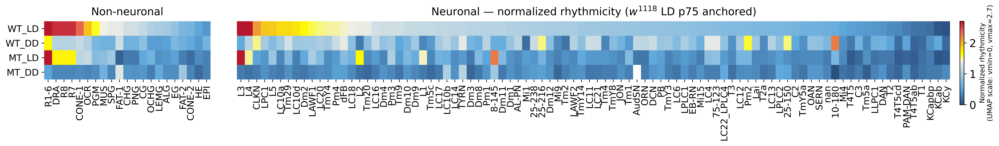

In [80]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.gridspec import GridSpec

# --- 1) Same colormap you defined ---
blue_yellow_red = LinearSegmentedColormap.from_list(
    "byr_soft3",
    [
        (0.0, "#2b4f81"),  # low
        (0.2, "#5fa9dd"),  # sky blue
        (0.52, "#f2efe6"), # light cream (short neutral zone)
        (0.62, "yellow"),  # yellow
        #(0.80, "#f4a582"),  # peach
        (0.9, "#e45757"),  # red
        (1.0, "#b5162b"),  # deep red
    ]
)

# --- 2) Build pivots from the SAME normalized scores used in UMAPs ---
def build_pivot_from_obs(X, metric_col, celltype_col):
    if metric_col not in X.obs:
        raise KeyError(f"Missing '{metric_col}' in .obs")
    if celltype_col not in X.obs:
        raise KeyError(f"Missing '{celltype_col}' in .obs")
    if "condition" not in X.obs:
        raise KeyError("Missing 'condition' in .obs")

    df = (X.obs[[celltype_col, "condition", metric_col]]
            .rename(columns={celltype_col: "celltype", metric_col: "score"})
            .copy())
    df["score"] = pd.to_numeric(df["score"], errors="coerce").replace([np.inf,-np.inf], np.nan)
    # aggregate per (celltype, condition) with mean (or median/p75 if you prefer)
    agg = (df.groupby(["celltype","condition"], dropna=False)["score"]
             .mean()
             .reset_index())
    piv = agg.pivot(index="celltype", columns="condition", values="score").fillna(np.nan)
    return piv

# Rebuild both pivots to guarantee they’re on the same normalized scale as UMAPs
piv_main = build_pivot_from_obs(adata, metric_col="sum_norm_main",   celltype_col="all_celltype")
piv_neur = build_pivot_from_obs(bdata, metric_col="sum_norm_global", celltype_col="neuron_celltype")

def _sort_by_WTLD(piv):
    if "WT_LD" in piv.columns:
        order = piv["WT_LD"].sort_values(ascending=False).index
        return piv.loc[order]
    # else sort by mean across available conditions
    order = piv.mean(axis=1).sort_values(ascending=False).index
    return piv.loc[order]

piv_main = _sort_by_WTLD(piv_main)
piv_neur = _sort_by_WTLD(piv_neur)


# --- 3) Remove unwanted from MAIN; keep MAIN strictly non-neuronal ---
# drop explicit excludes
for cell in ["Unannotated", "LC22-LPLC4"]:
    if cell in piv_main.index:
        piv_main = piv_main.drop(index=cell)

for cell in [np.nan]:
    if cell in piv_neur.index:
        piv_neur = piv_neur.drop(index=cell)

# also drop any celltypes that appear in the neuronal list (keep MAIN non-neuronal only)
neuronal_names = set(bdata.obs["neuron_celltype"].astype(str).unique().tolist())
piv_main_non_neuronal = piv_main.loc[[ct for ct in piv_main.index if ct not in neuronal_names]]


# --- 4) Fix color scale to match UMAPs exactly ---
VMIN = 0.0
VMAX = 2.7

# --- 5) Small helper to plot transposed heatmaps (conditions as rows, cell types as columns) ---
def plot_transposed_heatmap(ax, M, title="", cmap=blue_yellow_red,
                            vmin=VMIN, vmax=VMAX,
                            xtick_fontsize=7, ytick_fontsize=11,
                            label_every=None, hide_y_labels=False, remove_y_ticks=False):
    cond_order = ["WT_LD","WT_DD","MT_LD","MT_DD"]
    cols = [c for c in cond_order if c in M.columns]
    if cols:
        M = M[cols]

    Mt = M.T  # rows: conditions, cols: cell types
    im = ax.imshow(Mt, aspect="auto", interpolation="nearest",
                   vmin=vmin, vmax=vmax, cmap=cmap)

    ax.set_yticks(np.arange(Mt.shape[0]))
    if hide_y_labels:
        ax.set_yticklabels([])
    else:
        ax.set_yticklabels(Mt.index, fontsize=ytick_fontsize)
    if remove_y_ticks:
        ax.set_yticks([])

    xticks = np.arange(Mt.shape[1])
    ax.set_xticks(xticks)
    labels = list(Mt.columns) if label_every is None else [
        lbl if (i % label_every == 0) else "" for i, lbl in enumerate(Mt.columns)
    ]
    ax.set_xticklabels(labels, rotation=90, ha="right", va="center",
                       rotation_mode="anchor", fontsize=xtick_fontsize)

    for s in ax.spines.values(): s.set_visible(False)
    ax.grid(False)
    ax.set_title(title, pad=8)
    return im


# --- 6) Equal block widths based on number of cell types shown in each panel ---
n_cols_main   = piv_main_non_neuronal.shape[0]
n_cols_neuron = piv_neur.shape[0]
width_ratios  = [n_cols_main, n_cols_neuron] if (n_cols_main>0 and n_cols_neuron>0) else [1,1]

# --- 7) Plot both with shared colorbar and the same UMAP scale ---
fig = plt.figure(figsize=(22, 2))
gs  = GridSpec(1, 2, figure=fig, width_ratios=width_ratios, wspace=0.06)

axL = fig.add_subplot(gs[0, 0])  # MAIN (non-neuronal) on the left
axR = fig.add_subplot(gs[0, 1])  # NEURONAL on the right

imL = plot_transposed_heatmap(
    axL, piv_main_non_neuronal,
    title="Non-neuronal",
    cmap=blue_yellow_red, vmin=VMIN, vmax=VMAX,
    xtick_fontsize=12, ytick_fontsize=12,
    hide_y_labels=False, remove_y_ticks=False
)
imR = plot_transposed_heatmap(
    axR, piv_neur,
    title=r"Neuronal — normalized rhythmicity ($w^{1118}$ LD p75 anchored)",
    cmap=blue_yellow_red, vmin=VMIN, vmax=VMAX,
    xtick_fontsize=12, ytick_fontsize=12,
    hide_y_labels=True, remove_y_ticks=True
)

cbar = fig.colorbar(imR, ax=[axL, axR], fraction=0.028, pad=0.015)
cbar.set_label("Normalized rhythmicity\n(UMAP scale: vmin=0, vmax=2.7)", fontsize = 9)

plt.subplots_adjust(bottom=0.38, right=0.93)
plt.show()


# PSEA on the unknown

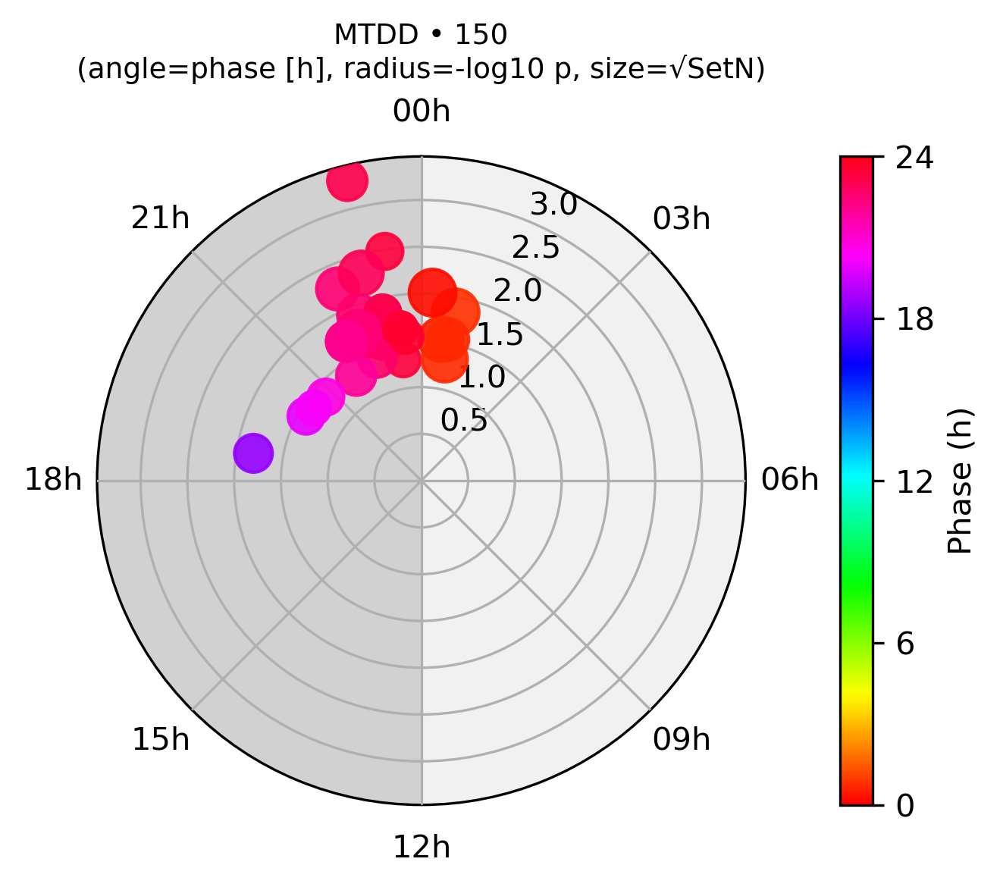

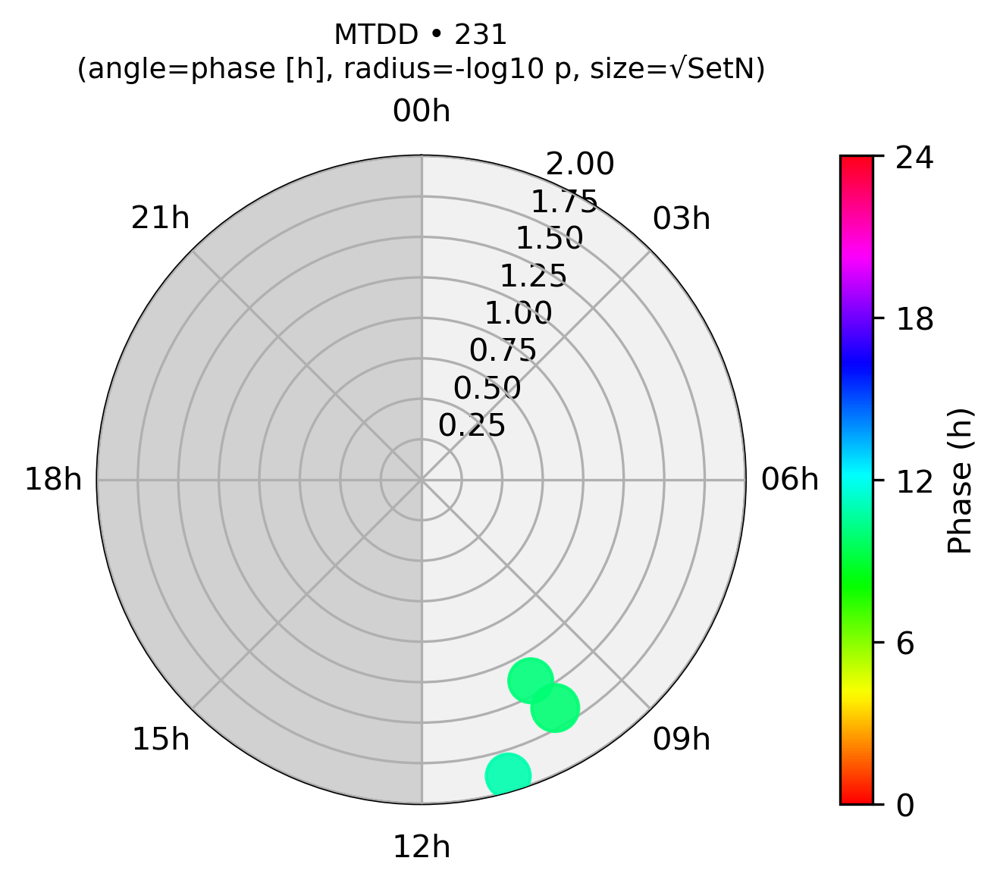

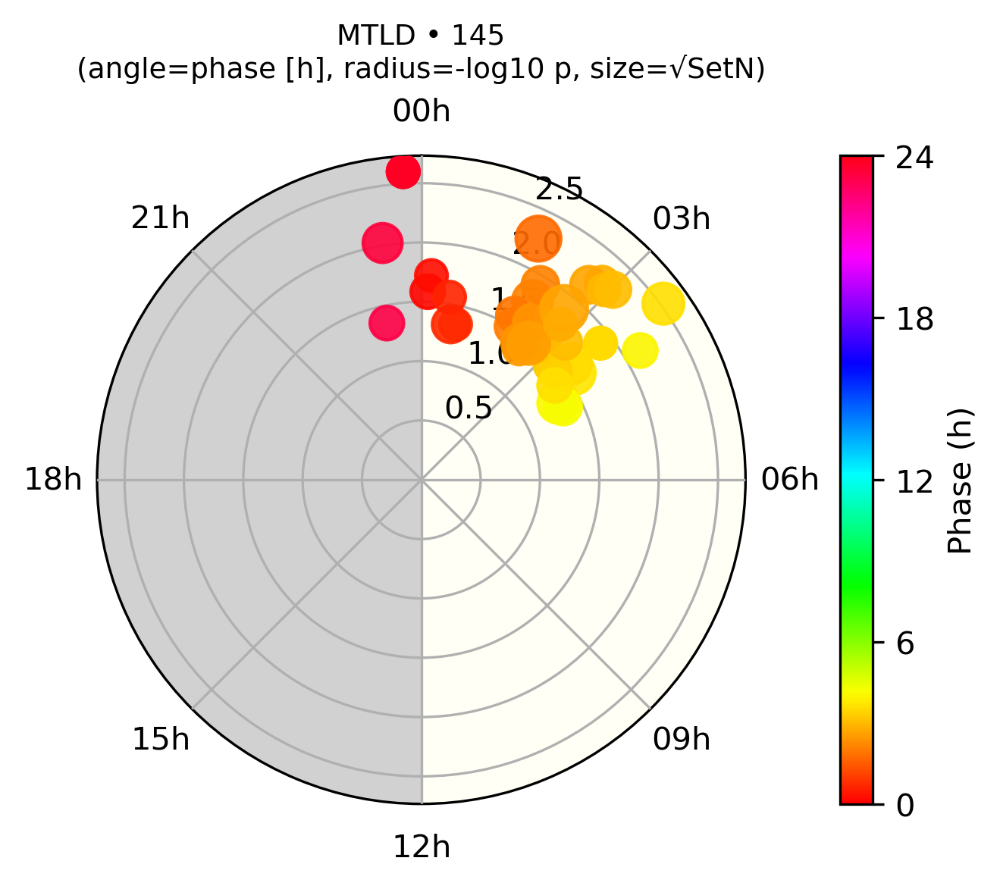

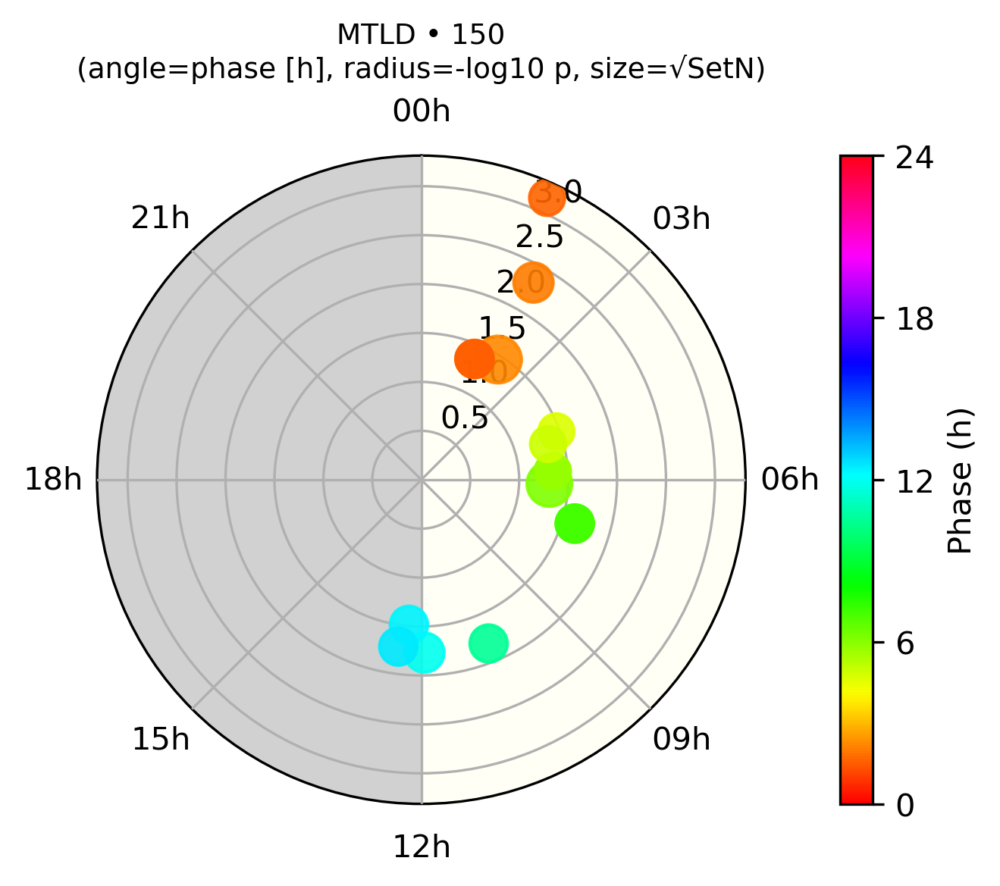

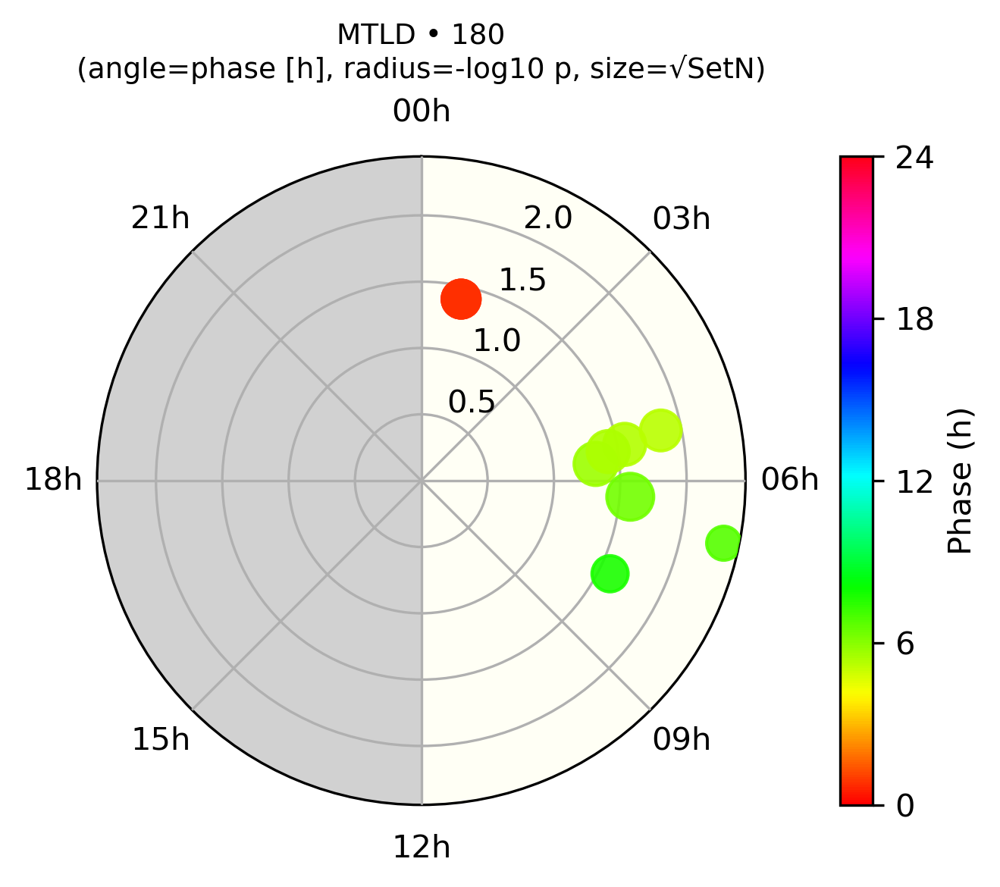

...

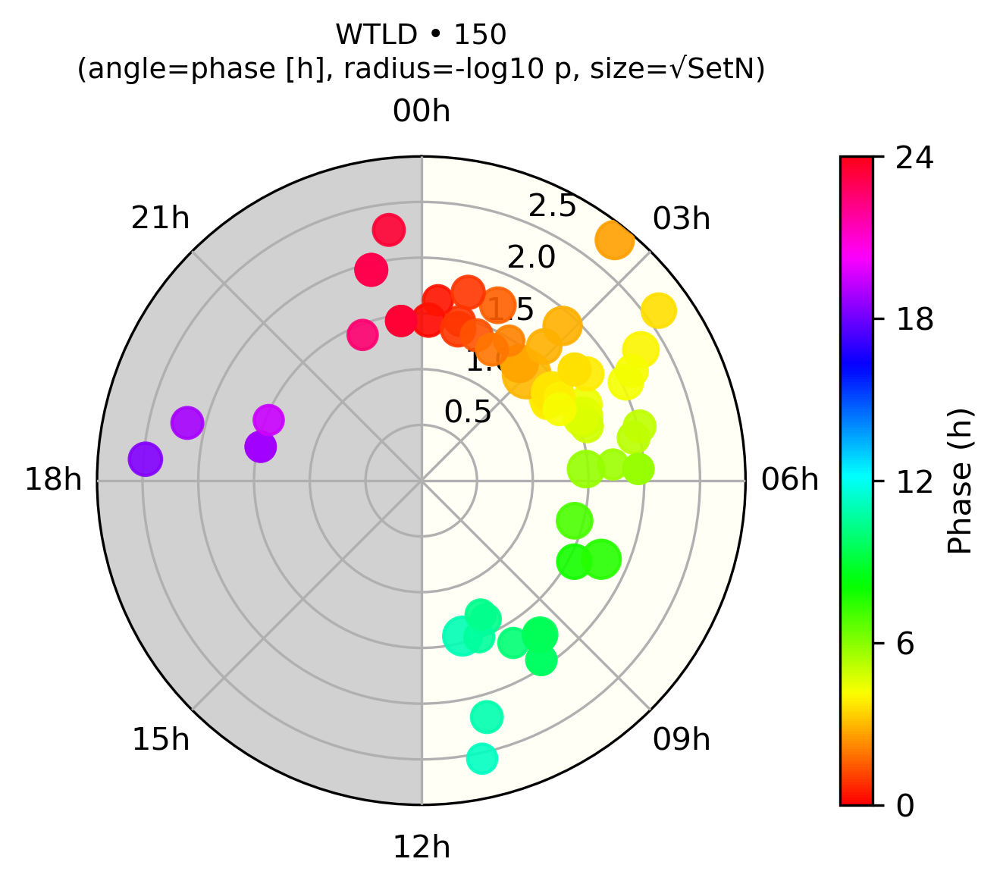

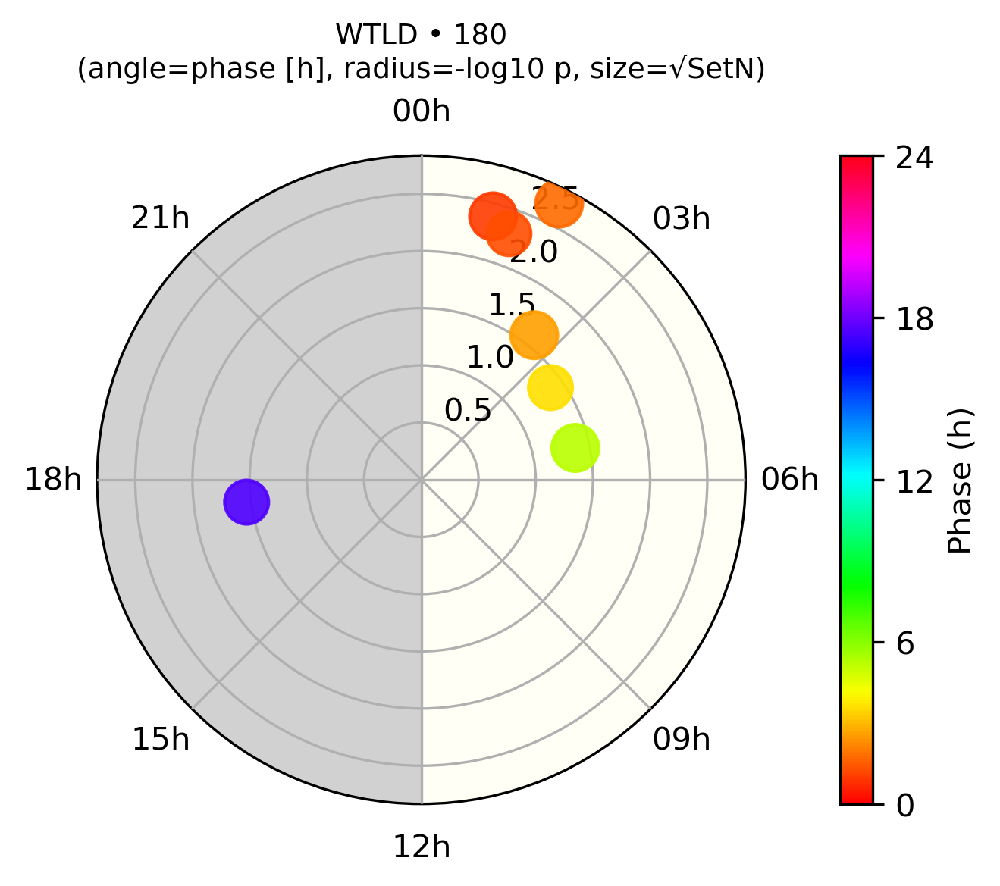

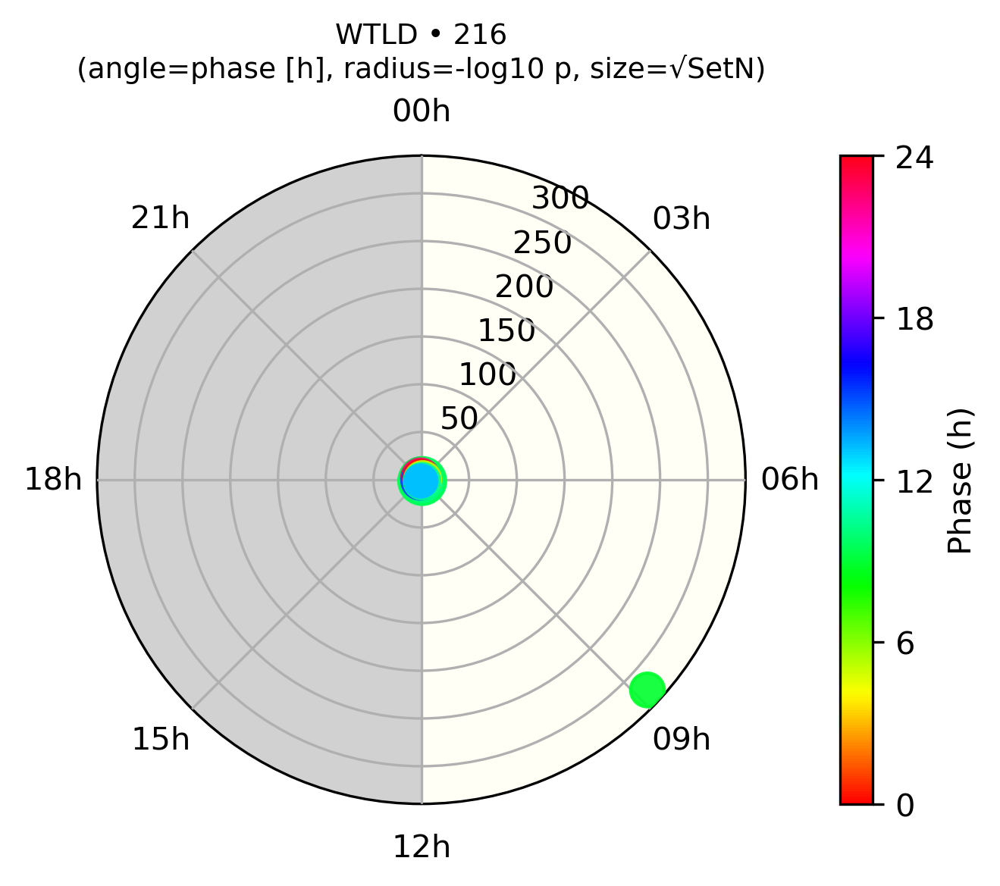

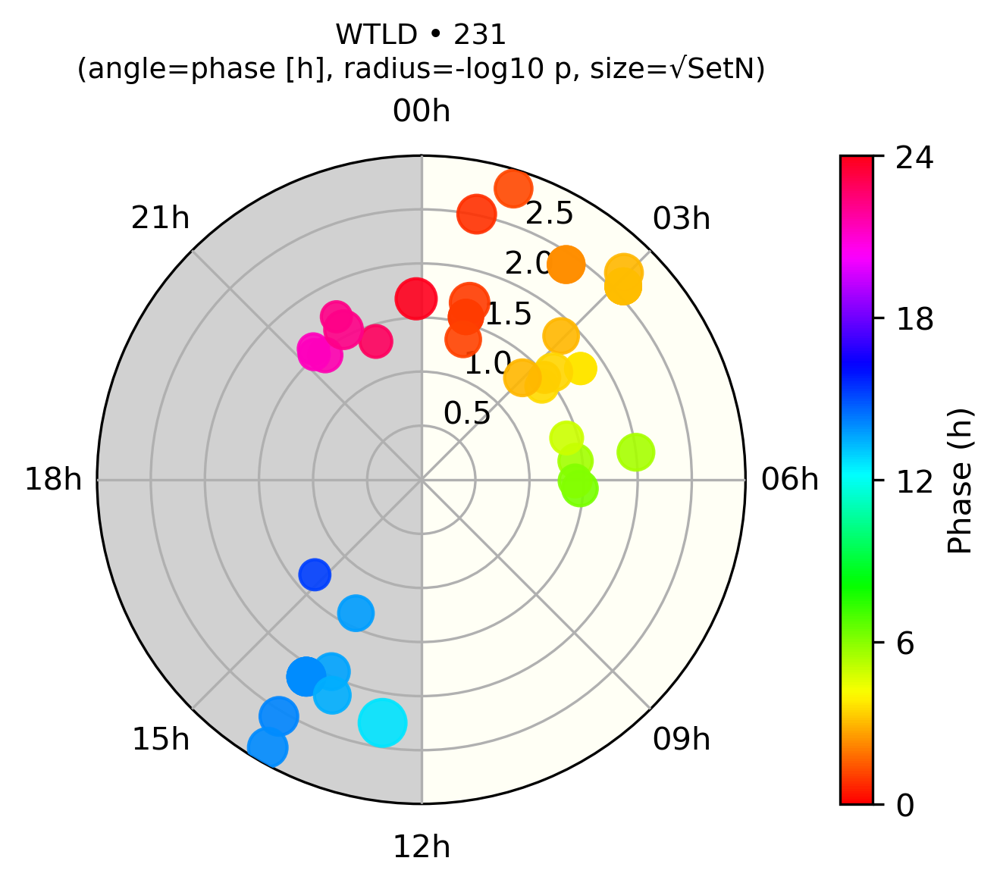

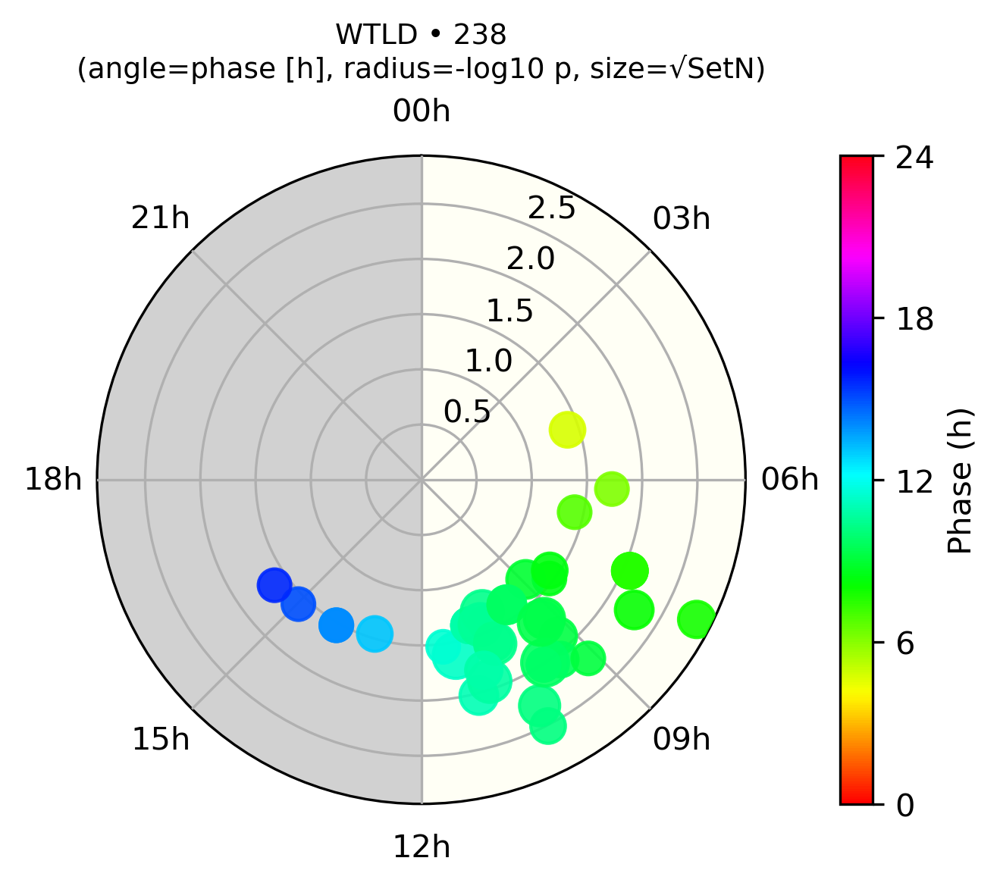

In [6]:
import numpy as np, math, matplotlib.pyplot as plt
import matplotlib as mpl

def map_phase_to_theta(phase_hours, offset_hours=0.0, mirror=False):
    ph = (np.asarray(phase_hours, dtype=float) + offset_hours) % 24.0
    th = (ph / 24.0) * 2 * math.pi
    if mirror:
        th = -th
    return th

TWO_PI = 2*np.pi

def shade_span_wrap(ax, theta_a, theta_b, *, color, alpha=0.30, zorder=0):
    a = theta_a % TWO_PI
    b = theta_b % TWO_PI
    if np.isclose(a, b):
        return
    if b >= a:
        ax.axvspan(a, b, facecolor=color, alpha=alpha, zorder=zorder)
    else:
        ax.axvspan(a, TWO_PI, facecolor=color, alpha=alpha, zorder=zorder)
        ax.axvspan(0.0, b, facecolor=color, alpha=alpha, zorder=zorder)

# ---- settings (fixed to avoid double-flip) ----
PHASE_OFFSET_HOURS = 0.0
CLOCKWISE = True          # clock-like progression
MIRROR   = False          # <- turn off to prevent left/right reversal

for (cond, ct), sub in plot_df.groupby(["Condition", "CellType"], sort=True):
    if sub.empty:
        continue

    phases_h = (sub["phase_hours"].to_numpy() % 24.0)
    theta    = map_phase_to_theta(phases_h, PHASE_OFFSET_HOURS, MIRROR)
    r        = sub["neglog10_p_bg"].to_numpy()

    base  = np.sqrt(np.clip(sub["SetN"].to_numpy(dtype=float), 1, None))
    denom = base.max() if np.isfinite(base).any() else 1.0
    sizes = (base / denom) * 200 + 20   # smaller dots

    fig = plt.figure(figsize=(5, 4), dpi=300)
    ax = fig.add_subplot(111, projection="polar")

    # Orientation
    ax.set_theta_zero_location("N")
    ax.set_theta_direction(-1 if CLOCKWISE else 1)

    # Radial limit
    rmax = float(np.nanmax(r)) if np.isfinite(r).any() else 1.0
    ax.set_ylim(0, rmax * 1.05)

    # Spans computed with the SAME MIRROR/OFFSET as points
    t0  = map_phase_to_theta(0.0,  PHASE_OFFSET_HOURS, MIRROR)
    t12 = map_phase_to_theta(12.0, PHASE_OFFSET_HOURS, MIRROR)
    t24 = map_phase_to_theta(24.0, PHASE_OFFSET_HOURS, MIRROR)  # == t0 mod 2π

    if "LD" in cond:
        shade_span_wrap(ax, t0,  t12, color="lightyellow", alpha=0.30, zorder=0)
        shade_span_wrap(ax, t12, t24, color="dimgray",     alpha=0.30, zorder=0)
    elif "DD" in cond:
        shade_span_wrap(ax, t0,  t12, color="lightgray", alpha=0.30, zorder=0)
        shade_span_wrap(ax, t12, t24, color="dimgray",   alpha=0.30, zorder=0)

    # Colors from phase (HSV 0–24h)
    norm   = mpl.colors.Normalize(vmin=0.0, vmax=24.0)
    cmap   = mpl.cm.hsv
    colors = cmap(norm(phases_h))

    # Points on top
    ax.scatter(theta, r, s=sizes, alpha=0.9, c=colors, zorder=3)

    # Grid/axes behind points
    ax.grid(True, zorder=0)
    for spine in ax.spines.values():
        spine.set_zorder(0)

    # Angular tick labels every 45° with 3h step
    grid_deg    = np.arange(0, 360, 45)
    hour_labels = [f"{int((h - PHASE_OFFSET_HOURS) % 24):02d}h" for h in range(0, 24, 3)]
    ax.set_thetagrids(grid_deg, labels=hour_labels)

    ax.set_title(f"{cond} • {ct}\n(angle=phase [h], radius=-log10 p, size=√SetN)", fontsize=9)

    # ---- Phase gradient colorbar (0–24 h) ----
    mappable = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
    mappable.set_array([])  # required by colorbar
    cbar = fig.colorbar(mappable, ax=ax, pad=0.10, fraction=0.046)
    cbar.set_label("Phase (h)")
    cbar.set_ticks([0, 6, 12, 18, 24])
    cbar.set_ticklabels(["0", "6", "12", "18", "24"])

    plt.tight_layout()
    plt.show()


In [3]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import pandas as pd, numpy as np, math

# =====================================================
# CONFIG: adjust paths if needed
# =====================================================
files = {
    "WTLD": "WTLD.csv",
    "WTDD": "WTDD.csv",
    "MTLD": "MTLD.csv",
    "MTDD": "MTDD.csv",
}

# =====================================================
# HELPERS
# =====================================================
def is_gobp(row):
    """Filter rows to GOBP biological process terms only."""
    sid = str(row.get("Set ID", "")).upper()
    go  = str(row.get("GO", "")).upper()
    return (
        ("GO_BIOLOGICAL_PROCESS" in sid)
        or ("GOBP" in sid)
        or ("BIOLOGICAL_PROCESS" in sid)
        or (go in {"BP", "BIOLOGICAL_PROCESS", "GOBP"})
    )

def neglog10(series):
    """Return -log10(p) with safe handling of zeros."""
    s = pd.to_numeric(series, errors="coerce").fillna(1.0)
    s = s.replace(0, np.nextafter(0, 1.0))
    return -np.log10(s)

def to_hours(series):
    """Map Vector-average value to circadian hours [0–24)."""
    x = pd.to_numeric(series, errors="coerce")
    mn, mx = x.min(skipna=True), x.max(skipna=True)
    if mx <= 24.1:            # already in hours
        return x % 24.0
    if mx <= 2*math.pi+0.1:   # radians
        return (x % (2*math.pi)) * (24.0/(2*math.pi))
    if mx <= 1.1:             # cycles
        return (x % 1.0) * 24.0
    # fallback: normalize
    return (x - mn) / (mx - mn + 1e-9) * 24.0

def circ_mean_hours(hours, weights=None):
    """Weighted circular mean of phases (in hours)."""
    ang = np.asarray(hours) * (2*math.pi/24.0)
    w = np.ones_like(ang) if weights is None else np.asarray(weights, dtype=float)
    C = np.sum(w*np.cos(ang)); S = np.sum(w*np.sin(ang))
    theta = math.atan2(S, C) % (2*math.pi)
    return theta * 24.0 / (2*math.pi)

# =====================================================
# LOAD AND PROCESS
# =====================================================
dfs = []
for cond, path in files.items():
    df = pd.read_csv(path)
    df["__condition__"] = cond
    dfs.append(df)
all_df = pd.concat(dfs, ignore_index=True)

# keep only GOBP
gobp = all_df[all_df.apply(is_gobp, axis=1)].copy()
gobp["neglog10_p_bg"] = neglog10(gobp["Kuiper p-value (vs. background)"])
gobp["phase_hours"]   = to_hours(gobp["Vector-average value"])
gobp["Set N"] = pd.to_numeric(gobp["Set N"], errors="coerce")
gobp["Vector-average magnitude"] = pd.to_numeric(
    gobp["Vector-average magnitude"], errors="coerce"
).fillna(1.0)

# collapse duplicates across (Condition, CellType, SetID)
rows = []
for (cond, ct, set_id), sub in gobp.groupby(["__condition__", "CellType", "Set ID"], sort=True):
    # minimum p-value → significance
    pmin = pd.to_numeric(sub["Kuiper p-value (vs. background)"], errors="coerce").min()
    neglog = -np.log10(pmin if (pd.notna(pmin) and pmin > 0) else np.nextafter(0, 1.0))
    setN  = sub["Set N"].max()
    # circular mean phase
    ph    = circ_mean_hours(sub["phase_hours"], weights=sub["Vector-average magnitude"])
    rows.append({
        "Condition": cond,
        "CellType": ct,
        "SetID": set_id,
        "SetN": setN,
        "neglog10_p_bg": neglog,
        "phase_hours": ph
    })

plot_df = pd.DataFrame(rows)

# =====================================================
# OUTPUT
# =====================================================
print(plot_df.head())
plot_df.to_csv("PSEA_results_dataframe.csv", index=False)
print("Saved dataframe to PSEA_results_dataframe.csv")


  Condition  CellType                                          SetID  SetN  \
0      MTDD       150               GOBP_APOPTOTIC_SIGNALING_PATHWAY     3   
1      MTDD       150  GOBP_CELLULAR_RESPONSE_TO_DNA_DAMAGE_STIMULUS     5   
2      MTDD       150          GOBP_CELL_CYCLE_G1_S_PHASE_TRANSITION     3   
3      MTDD       150               GOBP_CELL_CYCLE_PHASE_TRANSITION     4   
4      MTDD       150                        GOBP_CELL_CYCLE_PROCESS     8   

   neglog10_p_bg  phase_hours  
0       1.551294    23.042953  
1       1.634512    22.367879  
2       1.305395    23.433513  
3       1.838632    23.135201  
4       2.236572    22.426352  
Saved dataframe to PSEA_results_dataframe.csv
